# **2D Animation Resolution Enhancement**
### Team 8
#### Xingjian Li 1011563096
#### Zixuan Xia 1011232818
#### Yu Tao 1011679060
#### Hankun Wang 1011796344



##### Colab Link
https://colab.research.google.com/drive/1E--B00b1jbRgxYqSrKqvVwJlf7LKfanw?usp=sharing

## **Introduction & Project Goal:**

The goal of this project is to enhance the quality of low-resolution videos by applying deep learning-based super-resolution techniques. Given a dataset of paired 360p (low-resolution) and 1080p (high-resolution) videos, we aim to train models that can upscale low-resolution frames while preserving fine details and perceptual quality. We implemented and evaluated three popular super-resolution models—SRCNN, FSRCNN, and RFDN—and compared their performance using PSNR and SSIM metrics. The final objective is to generate high-quality 1080p video outputs from compressed 360p inputs in an efficient, end-to-end pipeline.


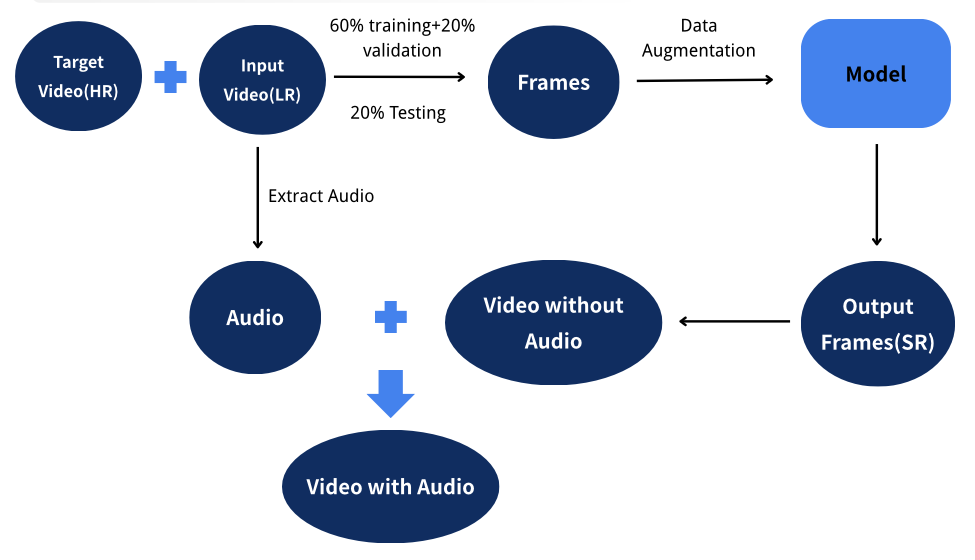

Update: The split ratio is 70%, 15% and 15%

## **Data:**

(Archived)The dataset(video) can be found and downloaded via [original link](https://www.bilibili.com/video/BV1ua4y1c7wk/?spm_id_from=333.337.search-card.all.click&vd_source=8a01a4be1976bdc67f39e330f0a3f22d)

or

[Google Drives: 360P](https://drive.google.com/file/d/1LWGHU_pa0oK0XyAYE2y_dJccVKY4tihS/view?usp=sharing)

[Google Drives: 1080P](https://drive.google.com/file/d/1jXYTLWq3XWkfIaMnspL6fcXOWDDtEFdq/view?usp=sharing)


**Important!**

Due to the limitation of computational power, we decided to use the dataset(video) with shorter length.

[New Link](https://www.bilibili.com/video/BV12z4y1x7Zy/?spm_id_from=333.337.search-card.all.click&vd_source=8a01a4be1976bdc67f39e330f0a3f22d) on BiliBili

[New Low Resolution Video](https://drive.google.com/file/d/1bm2PmjhQcFkQl6MRPzau0_Hv4P1T0itJ/view?usp=drive_link) in our Google Shared Drive

[New High Resolution Video](https://drive.google.com/file/d/15zNCyR2ivUGez5gyYjAdQfhTJ40CxFtB/view?usp=drive_link) in our Google Shared Drive

In [ ]:
# prompt: connect to gdrive

from google.colab import drive
drive.mount('/content/drive/')
data_path = '/content/drive/MyDrive/UT/MIE1517/Project/data' # modify it to fit your own path


Mounted at /content/drive/


### Data Visualization - Extracted Training Frames Preview
Note: This section is added at the end stage of the report so we display the frames by adding them directly rather than run the pipeline again to save time.

In [ ]:
from PIL import Image

low_res_paths = ['/content/low1.PNG', 'low2.PNG', 'low3.PNG']
high_res_paths = ['high1.PNG', 'high2.PNG', 'high3.PNG']

# Set target size (same as high-res)
target_size = (1920, 1080)

# Open and resize images
low_images = [Image.open(p).resize(target_size, Image.BICUBIC) for p in low_res_paths]
high_images = [Image.open(p).resize(target_size, Image.BICUBIC) for p in high_res_paths]

def concat_images_horizontally(images):
    total_width = target_size[0] * len(images)
    height = target_size[1]
    new_im = Image.new('RGB', (total_width, height))
    x_offset = 0
    for im in images:
        new_im.paste(im, (x_offset, 0))
        x_offset += target_size[0]
    return new_im

# Two rows for low and high-res images
row1 = concat_images_horizontally(low_images)
row2 = concat_images_horizontally(high_images)

# Stack rows vertically
total_width = row1.width
total_height = row1.height + row2.height
final_image = Image.new('RGB', (total_width, total_height))

final_image.paste(row1, (0, 0))
final_image.paste(row2, (0, row1.height))

final_image.save('comparison_grid.jpg')
final_image.show()

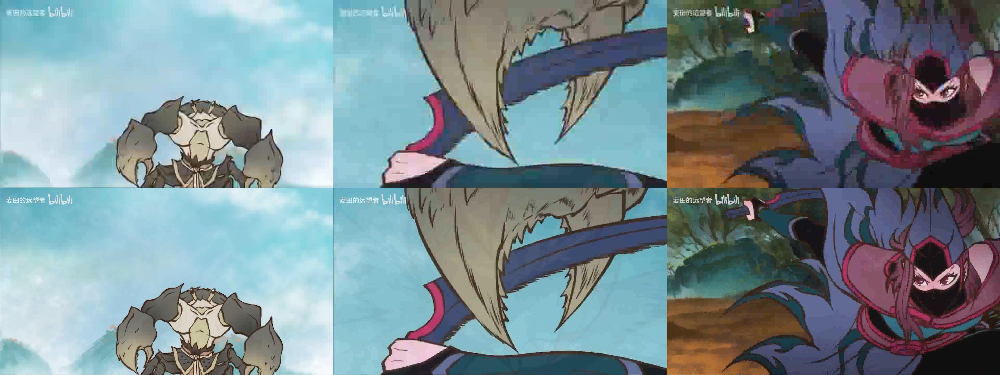

## **Progress Report (March 11)** ##

The four video links above represent the entire dataset we have used so far. Below, we have implemented the three models mentioned in our proposal. Due to computational limitations, we were only able to print the results of SRCNN and FSRCNN trained over a couple of epochs. Training Real-ESRGAN resulted in a CUDA out-of-memory issue. To address this, we plan to train and fine tune both FSRCNN and Real-ESRGAN on Google Colab by purchasing additional computational resources. Ideally, our project aims to generate a high-resolution video from a low-resolution input video. To achieve this, we first split the video into thousands of frames, process these frames through our models, and then reconstruct them into a video using the enhanced high-resolution frames. However, as mentioned earlier, we have not yet reconstructed the output into a complete video due to computational constraints. Instead, we have printed a few sample images to demonstrate that our models are functioning correctly. Since we have completed the most challenging aspects of the project—data processing and model development—we are confident that we can complete the remaining tasks within the available timeframe. The final steps include hyperparameter tuning and video reconstruction. We hope that Google Colab will provide sufficient computational power for training FSRCNN and Real-ESRGAN. If not, we may need to consider alternative models.

## **Update (April 4)** ##

The final models are SRCNN, FSRCNN and RFDN.

### Libraries and Packages

In [ ]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 960.9/960.9 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 115.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 86.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 56.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 38.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 17.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 94.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninst

In [ ]:
!pip install ffmpeg

  Preparing metadata (setup.py) ... done
  Created wheel for ffmpeg: filename=ffmpeg-1.4-py3-none-any.whl size=6082 sha256=ffdb8131c5310863d8f2d3a96439d59f99cfb77142a0983f6f45e2f2b3b5c0f6
  Stored in directory: /root/.cache/pip/wheels/56/30/c5/576bdd729f3bc062d62a551be7fefd6ed2f761901568171e4e
Successfully built ffmpeg


In [ ]:
!pip install ffmpeg-python

In [ ]:
import numpy as np
import pandas as pd
import random
import cv2
from tqdm import tqdm
import ffmpeg
from PIL import Image
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.functional import interpolate
import torch.optim as optim
import torchvision
from torch.utils.data.sampler import SubsetRandomSampler
import os
from torch.amp import GradScaler, autocast
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split, Dataset
from torchmetrics.functional import structural_similarity_index_measure as ssim
import matplotlib.pyplot as plt
%matplotlib inline
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
print("working on ", device)

working on  cuda


## If you have not uploaded the videos to Colab Content Folder, the brief instruction is below

Click Files icon, find 'content', right-click it, choose 'upload'

## **Data Preprocessing**

### Video Path and Name

In [ ]:
# Video paths for Low Resolution and High Resolution
lr_video_path = r'lr video new.mp4'  # 360P
hr_video_path = r'hr video new.mp4'  # 1080P

lr_video_path = os.path.join(data_path, lr_video_path) # comment these two lines if you didn't mount to gdrive
hr_video_path = os.path.join(data_path, hr_video_path)

# Output path to save the extracted frames/images
output_dir_hr_train = r'hr image train'
output_dir_lr_train = r'lr image train'
output_dir_hr_val = r'hr image val'
output_dir_lr_val = r'lr image val'
output_dir_hr_test = r'hr image test'
output_dir_lr_test = r'lr image test'
os.makedirs(output_dir_hr_train, exist_ok=True)
os.makedirs(output_dir_lr_train, exist_ok=True)
os.makedirs(output_dir_hr_val, exist_ok=True)
os.makedirs(output_dir_lr_val, exist_ok=True)
os.makedirs(output_dir_hr_test, exist_ok=True)
os.makedirs(output_dir_lr_test, exist_ok=True)

In [ ]:
# Check the total length of the video
total_length = ffmpeg.probe(lr_video_path)['streams'][0]['duration']
total_length

'293.566312'

### Calculate the Video's Frame Rate

In [ ]:
def get_video_frame_rate(video_path):
    probe = ffmpeg.probe(video_path)
    stream = next((stream for stream in probe['streams'] if stream['codec_type'] == 'video'), None)
    frame_rate = eval(stream['avg_frame_rate'])  # Calculate the frame rate
    return frame_rate

# Frame rate for lr and hr
frame_rate_lr = get_video_frame_rate(lr_video_path)
frame_rate_hr = get_video_frame_rate(hr_video_path)
print(f"Original LR Video Frame Rate: {frame_rate_lr} FPS")
print(f"Original HR Video Frame Rate: {frame_rate_hr} FPS")

Original LR Video Frame Rate: 30.000036192844846 FPS
Original HR Video Frame Rate: 30.000036192844846 FPS


### Find the Video's Original Resolution (Frame Size)

In [ ]:
def get_video_resolution(video_path):
    cap = cv2.VideoCapture(video_path)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    cap.release()
    return width, height

# 360P
original_width_lr, original_height_lr = get_video_resolution(lr_video_path)
print(f'Original 360 resolution: {original_width_lr}x{original_height_lr}')
# 1080P
original_width_hr, original_height_hr = get_video_resolution(hr_video_path)
print(f'Original 1080 resolution: {original_width_hr}x{original_height_hr}')

Original 360 resolution: 640x360
Original 1080 resolution: 1920x1080


###  Split Both Videos Into Training, Validation and Testing. (205s, 44.28s, 44.28s/70%, 30%, 30%)

The split rule is based on the video's length, with the first 70% as training, remaining 30% as validation and testing equally. (0 - 205s, 205 - 250s, 250 - 295s)

In [ ]:
# Create the output path for training, validation and testing videos

lr_video_path_train = r'360p_train.mp4'
hr_video_path_train = r'1080p_train.mp4'
lr_video_path_val = r'360p_val.mp4'
hr_video_path_val = r'1080p_val.mp4'
lr_video_path_test = r'360p_test.mp4'
hr_video_path_test = r'1080p_test.mp4'

In [ ]:
train_length = int(float(total_length)*0.7)
train_length

205

In [ ]:
val_length = (float(total_length) - int(float(total_length)*0.7))/2
val_length

44.28315599999999

In [ ]:
# Create a function to split the video

def split_video(video_path, start_time, duration, output_path):
    (
        ffmpeg.input(video_path, ss=start_time, t=duration)
        .output(output_path)
        .run()
    )

# First 205 seconds as training
split_video(lr_video_path, 0, train_length, lr_video_path_train)
split_video(hr_video_path, 0, train_length, hr_video_path_train)

# Next 45 seconds as validation
split_video(lr_video_path, train_length, val_length, lr_video_path_val)
split_video(hr_video_path, train_length, val_length, hr_video_path_val)

# Last 45 seconds as testing (extend by 0.5s to avoid missing frames in extraction)
split_video(lr_video_path, train_length+val_length, val_length+0.5, lr_video_path_test)
split_video(hr_video_path, train_length+val_length, val_length+0.5, hr_video_path_test)

### Extract the Sound/BGM

In [ ]:
# Create output path for the sound/bgm files

audio_path_lr_train = r'lr_audio_train.mp3'
audio_path_hr_train = r'hr_audio_train.mp3'
audio_path_lr_val = r'lr_audio_val.mp3'
audio_path_hr_val = r'hr_audio_val.mp3'
audio_path_lr_test = r'lr_audio_test.mp3'
audio_path_hr_test = r'hr_audio_test.mp3'

In [ ]:
# Define a function to extract the sound

def extract_audio(video_path, output_audio_path):
    ffmpeg.input(video_path).output(output_audio_path, q=0).run()
    print(f'Audio saved to {output_audio_path}')

extract_audio(hr_video_path_train, audio_path_hr_train) # Extract HR Audio Train
extract_audio(lr_video_path_train, audio_path_lr_train) # Extract LR Audio Train
extract_audio(hr_video_path_val, audio_path_hr_val) # Extract HR Audio Val
extract_audio(lr_video_path_val, audio_path_lr_val) # Extract LR Audio Val
extract_audio(hr_video_path_test, audio_path_hr_test) # Extract HR Audio Test
extract_audio(lr_video_path_test, audio_path_lr_test) # Extract LR Audio Test

Audio saved to hr_audio_train.mp3
Audio saved to lr_audio_train.mp3
Audio saved to hr_audio_val.mp3
Audio saved to lr_audio_val.mp3
Audio saved to hr_audio_test.mp3
Audio saved to lr_audio_test.mp3


### Extract the frames from training, validation and testing videos respectively

In [ ]:
def extract_frames(video_path, output_dir, frame_rate):
    os.makedirs(output_dir, exist_ok=True)
    ffmpeg.input(video_path).output(f"{output_dir}/frame_%05d.png", r=frame_rate).run()

In [ ]:
# HR Train
extract_frames(hr_video_path_train, output_dir_hr_train, frame_rate_hr)
# HR Val
extract_frames(hr_video_path_val, output_dir_hr_val, frame_rate_hr)
# HR Test
extract_frames(hr_video_path_test, output_dir_hr_test, frame_rate_hr)
# LR Train
extract_frames(lr_video_path_train, output_dir_lr_train, frame_rate_lr)
# LR Val
extract_frames(lr_video_path_val, output_dir_lr_val, frame_rate_lr)
# LR Test
extract_frames(lr_video_path_test, output_dir_lr_test, frame_rate_lr)

### Pair Up the Low Resolution and High Resolution Frames as Input and Target

In [ ]:
class AnimationDataset(Dataset):
    def __init__(self, lr_frames_dir, hr_frames_dir, lr_transform=None, hr_transform=None):
        self.lr_frames = sorted(os.listdir(lr_frames_dir))
        self.hr_frames = sorted(os.listdir(hr_frames_dir))
        self.lr_frames_dir = lr_frames_dir
        self.hr_frames_dir = hr_frames_dir
        self.lr_transform = lr_transform
        self.hr_transform = hr_transform

    def __len__(self):
        return len(self.lr_frames)

    def __getitem__(self, idx):
        lr_image = Image.open(os.path.join(self.lr_frames_dir, self.lr_frames[idx]))
        hr_image = Image.open(os.path.join(self.hr_frames_dir, self.hr_frames[idx]))

        # Set the seed to make sure same flip, rotation and color jitter are applied to LR and HR in training set
        #seed = random.randint(0,999)
        seed = 10
        if self.lr_transform:
            torch.manual_seed(seed)
            lr_image = self.lr_transform(lr_image)
        if self.hr_transform:
            torch.manual_seed(seed)
            hr_image = self.hr_transform(hr_image)
        return lr_image, hr_image

### Data Transformation and Augmentation

In [ ]:
# Data Preprocessing and Augmentation for Input (LR)

# Training Data Transformation

# For Model SRCNN, FSRCNN and RFDN
lr_transform_1 = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.15),  # lower Prob
    transforms.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.15),  # Higher Prob
    #transforms.Resize((320, 640)),  # Resize (keep the H W Ratio)
    transforms.ToTensor(),  # Convert to Tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalization
])

# For Model ESRGAN
lr_transform_esrgan = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.3),  # Higher Prob
    transforms.RandomVerticalFlip(p=0.3),  # Higher Prob
    transforms.RandomRotation(degrees=15),
    #transforms.RandomResizedCrop(size=(256, 256), scale=(0.8, 1.0)),  # Random Resize
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    #transforms.Resize((270, 480)),  # Resize HXW
    transforms.ToTensor(),  # Convert to Tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalization
])

# Validation and Test Data Transformation (Only Resize and Normalization are applied)

# For Model SRCNN, FSRCNN and RFDN
lr_transform_1_not_train = transforms.Compose([
    #transforms.Resize((180, 320)),  # Resize (keep the H W Ratio)
    transforms.ToTensor(),  # Convert to Tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalization
])

# For Model ESRGAN
lr_transform_others_not_train = transforms.Compose([
    #transforms.Resize((270, 480)),  # Resize (keep the H W Ratio)
    transforms.ToTensor(),  # Convert to Tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalization
])

In [ ]:
# Data Preprocessing for Target (HR)

# Training Data Transformation
# SRCNN, FSRCNN, RFDN
hr_transform_1_train = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.15),  # lower Prob
    transforms.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.15),  # Higher Prob
    #transforms.Resize((180, 320)),  # Resize to the same size as input, we can interpolate to resize it back to original HR size
    transforms.ToTensor(),  # Convert to Tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# ESRGAN

hr_transform_esrgan_train = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.3),  # Higher Prob
    transforms.RandomVerticalFlip(p=0.3),  # Higher Prob
    transforms.RandomRotation(degrees=15),
    #transforms.RandomResizedCrop(size=(256, 256), scale=(0.8, 1.0)),  # Random Resize
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.Resize((540, 960)),
    transforms.ToTensor(),  # Convert to Tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Validation (Only Normalization are applied)
hr_transform_1_val = transforms.Compose([
    #transforms.Resize((180, 320)),  # Resize to the same size as input, we can interpolate to resize it back to original HR size
    transforms.ToTensor(),  # Convert to Tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])



hr_transform_esrgan_val = transforms.Compose([
    transforms.Resize((540, 960)),
    transforms.ToTensor(),  # Convert to Tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Test Data Transformation (Only and Normalization are applied)
hr_transform_1_test = transforms.Compose([
    #transforms.Resize((180, 320)),  # Resize to the same size as input, we can interpolate to resize it back to original HR size
    transforms.ToTensor(),  # Convert to Tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])


hr_transform_esrgan_test = transforms.Compose([
    transforms.ToTensor(),  # Convert to Tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

## **Main Stage - Modeling, Functions, Concepts**
### Training and Evaluating Function

In [ ]:
!pip install torch_optimizer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.9/55.9 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 kB 2.9 MB/s eta 0:00:00


In [ ]:
from torch_optimizer import Lookahead

In [ ]:
# Training Function
def train(model, train_loader, val_loader, criterion, learning_rate, weight_decay, num_epochs=30, optim_method='adam'):
    model.to(device)
    best_val_psnr = 0.0
    best_val_ssim = 0.0

    if optim_method == 'adamw':
       base_optimizer = optim.AdamW(model.parameters(), lr=learning_rate, betas=(0.9, 0.999), weight_decay=weight_decay)
       optimizer = Lookahead(base_optimizer)
    else:
       optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', factor=0.5, patience=2, threshold=0.001)

    train_losses = []
    val_losses = []
    psnr_list = []
    ssim_list = []

    scaler = GradScaler()

    for epoch in range(num_epochs):
        model.train()
        epoch_train_loss = 0.0
        epoch_train_psnr = 0.0
        epoch_train_ssim = 0.0
        progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")

        for lr, hr in progress_bar:
            lr, hr = lr.to(device), hr.to(device)

            optimizer.zero_grad()

            # Mixed precision training
            with autocast(device_type=device.type):
              # Feed Forward
              sr = model(lr)

              # Calculate the loss
              loss = criterion(sr, hr)

              # Backward pass with gradient scaling
              scaler.scale(loss).backward()
              scaler.step(optimizer)
              scaler.update()

            #loss.backward()
            #optimizer.step()

            #train_psnr = calculate_psnr(sr, hr)
            #train_ssim = calculate_ssim(sr, hr)

            epoch_train_loss += loss.item()
            #epoch_train_psnr += train_psnr
            #epoch_train_ssim += train_ssim
            progress_bar.set_postfix({"Loss": loss.item()})

        # Calculate Average Train Loss
        avg_train_loss = epoch_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # Calculate Average Train PSNR and SSIM
        #avg_train_psnr = epoch_train_psnr / len(train_loader)
        #avg_train_ssim = epoch_train_ssim / len(train_loader)

         # Calculate Average Validation Loss and Metrics: PSNR, SSIM
        val_loss, val_psnr, val_ssim = evaluate(model, val_loader, criterion)
        val_psnr = val_psnr.cpu().numpy()  # Move to CPU and convert to numpy
        val_ssim = val_ssim.cpu().numpy()  # Move to CPU and convert to numpy
        val_losses.append(val_loss)
        psnr_list.append(val_psnr)
        ssim_list.append(val_ssim)

        # Step the scheduler with val_ssim if optimizing for perceptual quality, val loss and psnr are also acceptable
        scheduler.step(val_psnr)

        print(f"Epoch {epoch+1}/{num_epochs}, "
              f"Train Loss: {avg_train_loss:.5f}, "
              #f"Train PSNR: {avg_train_psnr:.4f}, "
              #f"Train SSIM: {avg_train_ssim:.4f}, "
              f"Val Loss: {val_loss:.5f}, "
              f"Val PSNR: {val_psnr:.4f}, "
              f"Val SSIM: {val_ssim:.4f}, "
              f"Latest LR: {scheduler.get_last_lr()[0]:.7f}")

        # Save the best model
        if val_psnr > best_val_psnr:
            best_val_psnr = val_psnr
            #try:
            torch.save(model.state_dict(), f"best_model_{model.name}.pth")
            print(f"Best model {model.name} saved!")
            #except:
             #   torch.save(model.state_dict(), f"best_model_real-esrgan.pth")
              #  print(f"Best model esrgan saved!")

        # Clear the cache for saving GPU memory
        #torch.cuda.empty_cache()

    # Plot the training curve
    plot_training_curve(train_losses, val_losses, psnr_list, ssim_list, num_epochs)

In [ ]:
from torchmetrics import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure
# Evaluation Function
def evaluate(model, data_loader, criterion):

    psnr = PeakSignalNoiseRatio(data_range=2.0).to(device)
    ssim = StructuralSimilarityIndexMeasure(data_range=2.0).to(device)

    model.eval()
    #total_psnr = 0.0
    #total_ssim = 0.0
    total_loss = 0.0

    with torch.no_grad():
        for lr, hr in data_loader:
            lr, hr = lr.to(device), hr.to(device)
            sr = model(lr)

            # Calculate loss
            loss = criterion(sr, hr)
            total_loss += loss.item()

            # Calculate PSNR, SSIM
            psnr.update(sr, hr)
            ssim.update(sr, hr)
            #psnr = calculate_psnr(sr, hr)
            #ssim = calculate_ssim(sr, hr)
            #total_psnr += psnr
            #total_ssim += ssim
            #total_loss += loss.item()

    #avg_psnr = total_psnr / len(data_loader)
    #avg_ssim = total_ssim / len(data_loader)
    avg_loss = total_loss / len(data_loader)

    return avg_loss, psnr.compute(), ssim.compute()

### Concepts: Performance Metrics

#### PSNR (Peak Signal-to-Noise Ratio): Measures the difference between the target image and the reconstructed image. (Primary Indicator - Better Image Quality) ####

#### SSIM (Structural Similarity Index): Measures the similarities of brightness, contrast and structure between the target image and the reconstructed image. (Secondary Indicator - Better Human Visual Perspective) ####

#### Brief Stats as Reference

**PSNR > 35 dB：Excellent Image Quality**

**PSNR > 30 dB：Good Image Quality**

**PSNR < 20 dB：Poor Image Quality**

**SSIM > 0.9：Excellent Image Quality**

**SSIM > 0.8：Good Image Quality**

**SSIM < 0.6：Poor Image Quality**

### Learning Curves Function

In [ ]:
def plot_training_curve(train_losses, val_losses, val_psnrs, val_ssims, num_epochs):
    plt.figure(figsize=(10, 24))

    # Loss
    plt.subplot(3, 1, 1)
    plt.plot(np.arange(1, num_epochs+1, 1), train_losses, label="Train Loss", color="blue")
    plt.plot(np.arange(1, num_epochs+1, 1), val_losses, label="Val Loss", color="red")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss Curve")
    plt.legend()
    plt.grid()

    # PSNR
    plt.subplot(3, 1, 2)
    plt.plot(np.arange(1, num_epochs+1, 1), val_psnrs, label="Val PSNR", color="green")
    plt.xlabel("Epoch")
    plt.ylabel("PSNR")
    plt.title("Validation PSNR Curve")
    plt.legend()
    plt.grid()

    # SSIM
    plt.subplot(3, 1, 3)
    plt.plot(np.arange(1, num_epochs+1, 1), val_ssims, label="Val SSIM", color="orange")
    plt.xlabel("Epoch")
    plt.ylabel("SSIM")
    plt.title("Validation SSIM Curve")
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()

### Initialize the DataLoaders and Pick the Models

In [ ]:
def choose_model(batch_size, num_workers=12):
    model_type = input('srcnn, fsrcnn, rfdn or r-esrgan:')
    if model_type.lower() in  ['srcnn', 'fsrcnn', 'rfdn']:
        lr_transform_train = lr_transform_1
        hr_transform_train = hr_transform_1_train
        lr_transform_val = lr_transform_1_not_train
        hr_transform_val = hr_transform_1_val
        lr_transform_test = lr_transform_1_not_train
        hr_transform_test = hr_transform_1_test
    else:
        lr_transform_train = lr_transform_esrgan
        hr_transform_train = hr_transform_esrgan_train
        lr_transform_val = lr_transform_others_not_train
        hr_transform_val = hr_transform_esrgan_val
        lr_transform_test = lr_transform_others_not_train
        hr_transform_test = hr_transform_esrgan_test

    # DataSet
    train_dataset = AnimationDataset(output_dir_lr_train, output_dir_hr_train, lr_transform_train, hr_transform_train)
    val_dataset = AnimationDataset(output_dir_lr_val, output_dir_hr_val, lr_transform_val, hr_transform_val)
    test_dataset = AnimationDataset(output_dir_lr_test, output_dir_hr_test, lr_transform_test, hr_transform_test)

    # DataLoader
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)

    # Check the size
    print(f'The number of frames in training set is: {len(train_loader.dataset)}')
    print(f'The number of frames in testing set is: {len(test_loader.dataset)}')
    print(f'The number of frames in validation set is: {len(val_loader.dataset)}')

    return train_dataset, val_dataset, test_dataset, train_loader, val_loader, test_loader

#### L1 Loss (Mean Absolute Error, MAE)

The formula for L1 loss is:

$$
L_1 = \frac{1}{N} \sum_{i=1}^{N} \left| y_i - \hat{y}_i \right|
$$

where:
- $ y_i $ is the target **HR** (High-Resolution) image.
- $ \hat{y}_i\$ is the model output **SR** (Super-Resolution) image.

##### Advantages:
- Not sensitive to outliers, leading to more stable training.
- Suitable for super-resolution tasks as it helps preserve fine details.

In [ ]:
criterion_L1 = nn.L1Loss()
criterion_L2 = nn.MSELoss()

## Model 1
### SRCNN - Super Resolution CNN <sup>[1]</sup>

![SRCNN Model Architecture](https://miro.medium.com/v2/resize:fit:720/format:webp/0*aXe4ptFFMUednX7e.png)

#### Note: For SRCNN, the input image size is 320x640, SR is 1080x1920, and the HR is also size 1080x1920.

In [ ]:
class SRCNN(nn.Module):
    def __init__(self, name, ksize1=9, ksize2=5, ksize3=5):
        super(SRCNN, self).__init__()
        self.name = name
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=ksize1, padding=4)
        self.relu1 = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=32, kernel_size=ksize2, padding=2)
        self.relu2 = nn.ReLU(inplace=True)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=3, kernel_size=ksize3, padding=2)

    def forward(self, x):
        x = interpolate(x, size=(1080, 1920), mode='bicubic', align_corners=False)
        x = self.relu1(self.conv1(x))
        x = self.relu2(self.conv2(x))
        x = self.conv3(x)  # Output HR image
        # Resize the output to match the target size (1080 1920 h w)
        #x = F.interpolate(x, size=(1080, 1920), mode='bicubic', align_corners=False)
        return x

#### SRCNN Training

##### Batch size = 32 for SRCNN due to RAM limitation

In [ ]:
train_dataset, val_dataset, test_dataset, train_loader, val_loader, test_loader = choose_model(32)

srcnn, fsrcnn, rfdn or r-esrgan:srcnn
The number of frames in training set is: 6150
The number of frames in testing set is: 1329
The number of frames in validation set is: 1329


##### Training and Hyperparameter Tuning

Learning Rate 0.001, Batch Size 32, Weight Decay 0, Epochs 30

In [ ]:
srcnn_1 = SRCNN('srcnn_1')

Epoch 1/30: 100%|██████████| 193/193 [03:07<00:00,  1.03it/s, Loss=0.0484]


Epoch 1/30, Train Loss: 0.05692, Val Loss: 0.05422, Val PSNR: 27.5630, Val SSIM: 0.8560, Latest LR: 0.0010000
Best model srcnn_1 saved!


Epoch 2/30: 100%|██████████| 193/193 [02:51<00:00,  1.13it/s, Loss=0.0389]


Epoch 2/30, Train Loss: 0.03923, Val Loss: 0.04903, Val PSNR: 27.9755, Val SSIM: 0.8611, Latest LR: 0.0010000
Best model srcnn_1 saved!


Epoch 3/30: 100%|██████████| 193/193 [03:04<00:00,  1.05it/s, Loss=0.0385]


Epoch 3/30, Train Loss: 0.03931, Val Loss: 0.04588, Val PSNR: 28.2786, Val SSIM: 0.8650, Latest LR: 0.0010000
Best model srcnn_1 saved!


Epoch 4/30: 100%|██████████| 193/193 [03:02<00:00,  1.06it/s, Loss=0.0365]


Epoch 4/30, Train Loss: 0.03834, Val Loss: 0.05288, Val PSNR: 27.9133, Val SSIM: 0.8665, Latest LR: 0.0010000


Epoch 5/30: 100%|██████████| 193/193 [02:56<00:00,  1.10it/s, Loss=0.044]


Epoch 5/30, Train Loss: 0.03723, Val Loss: 0.04773, Val PSNR: 28.2833, Val SSIM: 0.8676, Latest LR: 0.0010000
Best model srcnn_1 saved!


Epoch 6/30: 100%|██████████| 193/193 [02:54<00:00,  1.11it/s, Loss=0.0374]


Epoch 6/30, Train Loss: 0.03684, Val Loss: 0.04309, Val PSNR: 28.6395, Val SSIM: 0.8705, Latest LR: 0.0010000
Best model srcnn_1 saved!


Epoch 7/30: 100%|██████████| 193/193 [02:54<00:00,  1.10it/s, Loss=0.0362]


Epoch 7/30, Train Loss: 0.03653, Val Loss: 0.04286, Val PSNR: 28.6916, Val SSIM: 0.8718, Latest LR: 0.0010000
Best model srcnn_1 saved!


Epoch 8/30: 100%|██████████| 193/193 [02:54<00:00,  1.11it/s, Loss=0.0373]


Epoch 8/30, Train Loss: 0.03650, Val Loss: 0.04555, Val PSNR: 28.5178, Val SSIM: 0.8698, Latest LR: 0.0010000


Epoch 9/30: 100%|██████████| 193/193 [02:53<00:00,  1.11it/s, Loss=0.0325]


Epoch 9/30, Train Loss: 0.03590, Val Loss: 0.04394, Val PSNR: 28.6859, Val SSIM: 0.8713, Latest LR: 0.0010000


Epoch 10/30: 100%|██████████| 193/193 [02:51<00:00,  1.12it/s, Loss=0.0392]


Epoch 10/30, Train Loss: 0.03550, Val Loss: 0.04681, Val PSNR: 28.4982, Val SSIM: 0.8725, Latest LR: 0.0005000


Epoch 11/30: 100%|██████████| 193/193 [02:53<00:00,  1.11it/s, Loss=0.0366]


Epoch 11/30, Train Loss: 0.03380, Val Loss: 0.04225, Val PSNR: 28.8475, Val SSIM: 0.8746, Latest LR: 0.0005000
Best model srcnn_1 saved!


Epoch 12/30: 100%|██████████| 193/193 [02:56<00:00,  1.09it/s, Loss=0.0316]


Epoch 12/30, Train Loss: 0.03349, Val Loss: 0.04222, Val PSNR: 28.8700, Val SSIM: 0.8747, Latest LR: 0.0005000
Best model srcnn_1 saved!


Epoch 13/30: 100%|██████████| 193/193 [02:56<00:00,  1.09it/s, Loss=0.033]


Epoch 13/30, Train Loss: 0.03348, Val Loss: 0.04288, Val PSNR: 28.8466, Val SSIM: 0.8751, Latest LR: 0.0005000


Epoch 14/30: 100%|██████████| 193/193 [02:54<00:00,  1.11it/s, Loss=0.0334]


Epoch 14/30, Train Loss: 0.03361, Val Loss: 0.04197, Val PSNR: 28.9174, Val SSIM: 0.8758, Latest LR: 0.0005000
Best model srcnn_1 saved!


Epoch 15/30: 100%|██████████| 193/193 [02:54<00:00,  1.11it/s, Loss=0.0431]


Epoch 15/30, Train Loss: 0.03371, Val Loss: 0.04359, Val PSNR: 28.8005, Val SSIM: 0.8752, Latest LR: 0.0005000


Epoch 16/30: 100%|██████████| 193/193 [02:53<00:00,  1.11it/s, Loss=0.0377]


Epoch 16/30, Train Loss: 0.03371, Val Loss: 0.04226, Val PSNR: 28.9114, Val SSIM: 0.8762, Latest LR: 0.0005000


Epoch 17/30: 100%|██████████| 193/193 [02:52<00:00,  1.12it/s, Loss=0.034]


Epoch 17/30, Train Loss: 0.03362, Val Loss: 0.04315, Val PSNR: 28.8599, Val SSIM: 0.8761, Latest LR: 0.0002500


Epoch 18/30: 100%|██████████| 193/193 [02:53<00:00,  1.11it/s, Loss=0.0313]


Epoch 18/30, Train Loss: 0.03314, Val Loss: 0.04139, Val PSNR: 28.9906, Val SSIM: 0.8769, Latest LR: 0.0002500
Best model srcnn_1 saved!


Epoch 19/30: 100%|██████████| 193/193 [02:52<00:00,  1.12it/s, Loss=0.0283]


Epoch 19/30, Train Loss: 0.03303, Val Loss: 0.04123, Val PSNR: 29.0064, Val SSIM: 0.8771, Latest LR: 0.0002500
Best model srcnn_1 saved!


Epoch 20/30: 100%|██████████| 193/193 [02:53<00:00,  1.11it/s, Loss=0.0313]


Epoch 20/30, Train Loss: 0.03306, Val Loss: 0.04146, Val PSNR: 28.9967, Val SSIM: 0.8771, Latest LR: 0.0002500


Epoch 21/30: 100%|██████████| 193/193 [02:54<00:00,  1.11it/s, Loss=0.0284]


Epoch 21/30, Train Loss: 0.03298, Val Loss: 0.04129, Val PSNR: 29.0140, Val SSIM: 0.8773, Latest LR: 0.0001250
Best model srcnn_1 saved!


Epoch 22/30: 100%|██████████| 193/193 [02:50<00:00,  1.13it/s, Loss=0.0278]


Epoch 22/30, Train Loss: 0.03286, Val Loss: 0.04121, Val PSNR: 29.0239, Val SSIM: 0.8773, Latest LR: 0.0001250
Best model srcnn_1 saved!


Epoch 23/30: 100%|██████████| 193/193 [02:52<00:00,  1.12it/s, Loss=0.033]


Epoch 23/30, Train Loss: 0.03286, Val Loss: 0.04115, Val PSNR: 29.0296, Val SSIM: 0.8774, Latest LR: 0.0001250
Best model srcnn_1 saved!


Epoch 24/30: 100%|██████████| 193/193 [02:50<00:00,  1.13it/s, Loss=0.0346]


Epoch 24/30, Train Loss: 0.03286, Val Loss: 0.04128, Val PSNR: 29.0276, Val SSIM: 0.8774, Latest LR: 0.0001250


Epoch 25/30: 100%|██████████| 193/193 [02:54<00:00,  1.11it/s, Loss=0.035]


Epoch 25/30, Train Loss: 0.03287, Val Loss: 0.04117, Val PSNR: 29.0364, Val SSIM: 0.8776, Latest LR: 0.0000625
Best model srcnn_1 saved!


Epoch 26/30: 100%|██████████| 193/193 [02:51<00:00,  1.13it/s, Loss=0.0321]


Epoch 26/30, Train Loss: 0.03277, Val Loss: 0.04105, Val PSNR: 29.0463, Val SSIM: 0.8777, Latest LR: 0.0000625
Best model srcnn_1 saved!


Epoch 27/30: 100%|██████████| 193/193 [02:53<00:00,  1.11it/s, Loss=0.0322]


Epoch 27/30, Train Loss: 0.03276, Val Loss: 0.04115, Val PSNR: 29.0410, Val SSIM: 0.8777, Latest LR: 0.0000625


Epoch 28/30: 100%|██████████| 193/193 [02:54<00:00,  1.11it/s, Loss=0.0333]


Epoch 28/30, Train Loss: 0.03276, Val Loss: 0.04109, Val PSNR: 29.0428, Val SSIM: 0.8776, Latest LR: 0.0000313


Epoch 29/30: 100%|██████████| 193/193 [02:52<00:00,  1.12it/s, Loss=0.0303]


Epoch 29/30, Train Loss: 0.03271, Val Loss: 0.04104, Val PSNR: 29.0493, Val SSIM: 0.8777, Latest LR: 0.0000313
Best model srcnn_1 saved!


Epoch 30/30: 100%|██████████| 193/193 [02:53<00:00,  1.11it/s, Loss=0.0357]


Epoch 30/30, Train Loss: 0.03273, Val Loss: 0.04105, Val PSNR: 29.0502, Val SSIM: 0.8777, Latest LR: 0.0000313
Best model srcnn_1 saved!


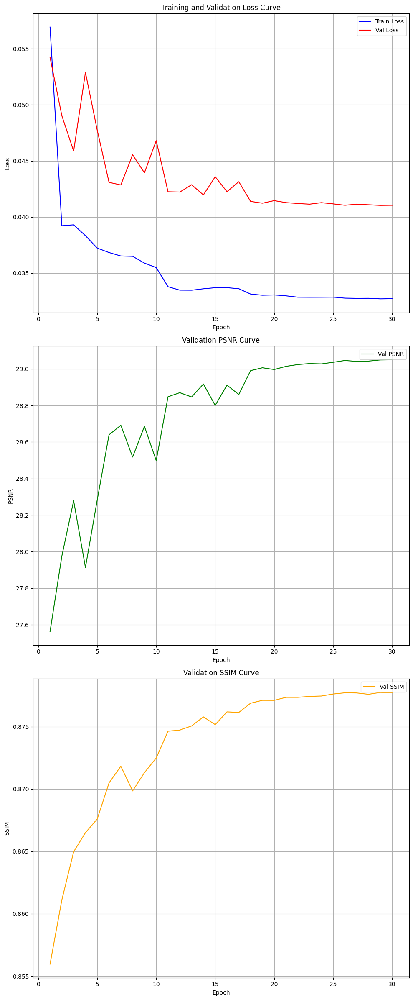

In [ ]:
train(srcnn_1, train_loader, val_loader, criterion_L1, 0.001, 0, num_epochs=30)

Learning Rate 0.001, Batch Size 32, Weight Decay 0.00001, Epochs 30

In [ ]:
srcnn_2 = SRCNN('srcnn_2')

Epoch 1/30: 100%|██████████| 193/193 [02:54<00:00,  1.10it/s, Loss=0.0472]


Epoch 1/30, Train Loss: 0.05589, Val Loss: 0.06131, Val PSNR: 26.8701, Val SSIM: 0.8497, Latest LR: 0.0010000
Best model srcnn_2 saved!


Epoch 2/30: 100%|██████████| 193/193 [02:53<00:00,  1.11it/s, Loss=0.0485]


Epoch 2/30, Train Loss: 0.03969, Val Loss: 0.05207, Val PSNR: 27.7544, Val SSIM: 0.8591, Latest LR: 0.0010000
Best model srcnn_2 saved!


Epoch 3/30: 100%|██████████| 193/193 [02:51<00:00,  1.13it/s, Loss=0.0384]


Epoch 3/30, Train Loss: 0.03894, Val Loss: 0.05447, Val PSNR: 27.6923, Val SSIM: 0.8595, Latest LR: 0.0010000


Epoch 4/30: 100%|██████████| 193/193 [02:53<00:00,  1.11it/s, Loss=0.0344]


Epoch 4/30, Train Loss: 0.03813, Val Loss: 0.04648, Val PSNR: 28.3194, Val SSIM: 0.8649, Latest LR: 0.0010000
Best model srcnn_2 saved!


Epoch 5/30: 100%|██████████| 193/193 [02:51<00:00,  1.13it/s, Loss=0.034]


Epoch 5/30, Train Loss: 0.03746, Val Loss: 0.04714, Val PSNR: 28.3055, Val SSIM: 0.8648, Latest LR: 0.0010000


Epoch 6/30: 100%|██████████| 193/193 [02:51<00:00,  1.12it/s, Loss=0.0414]


Epoch 6/30, Train Loss: 0.03781, Val Loss: 0.04455, Val PSNR: 28.5218, Val SSIM: 0.8679, Latest LR: 0.0010000
Best model srcnn_2 saved!


Epoch 7/30: 100%|██████████| 193/193 [02:52<00:00,  1.12it/s, Loss=0.0363]


Epoch 7/30, Train Loss: 0.03632, Val Loss: 0.05523, Val PSNR: 27.7074, Val SSIM: 0.8654, Latest LR: 0.0010000


Epoch 8/30: 100%|██████████| 193/193 [02:53<00:00,  1.11it/s, Loss=0.0336]


Epoch 8/30, Train Loss: 0.03717, Val Loss: 0.04582, Val PSNR: 28.5419, Val SSIM: 0.8713, Latest LR: 0.0010000
Best model srcnn_2 saved!


Epoch 9/30: 100%|██████████| 193/193 [02:53<00:00,  1.11it/s, Loss=0.0334]


Epoch 9/30, Train Loss: 0.03536, Val Loss: 0.04862, Val PSNR: 28.3262, Val SSIM: 0.8689, Latest LR: 0.0005000


Epoch 10/30: 100%|██████████| 193/193 [02:52<00:00,  1.12it/s, Loss=0.0441]


Epoch 10/30, Train Loss: 0.03391, Val Loss: 0.04261, Val PSNR: 28.7887, Val SSIM: 0.8738, Latest LR: 0.0005000
Best model srcnn_2 saved!


Epoch 11/30: 100%|██████████| 193/193 [02:52<00:00,  1.12it/s, Loss=0.0348]


Epoch 11/30, Train Loss: 0.03365, Val Loss: 0.04259, Val PSNR: 28.8320, Val SSIM: 0.8746, Latest LR: 0.0005000
Best model srcnn_2 saved!


Epoch 12/30: 100%|██████████| 193/193 [02:53<00:00,  1.11it/s, Loss=0.0346]


Epoch 12/30, Train Loss: 0.03377, Val Loss: 0.04179, Val PSNR: 28.9040, Val SSIM: 0.8753, Latest LR: 0.0005000
Best model srcnn_2 saved!


Epoch 13/30: 100%|██████████| 193/193 [02:51<00:00,  1.12it/s, Loss=0.0329]


Epoch 13/30, Train Loss: 0.03360, Val Loss: 0.04270, Val PSNR: 28.8613, Val SSIM: 0.8751, Latest LR: 0.0005000


Epoch 14/30: 100%|██████████| 193/193 [02:53<00:00,  1.11it/s, Loss=0.0318]


Epoch 14/30, Train Loss: 0.03352, Val Loss: 0.04220, Val PSNR: 28.9188, Val SSIM: 0.8759, Latest LR: 0.0005000
Best model srcnn_2 saved!


Epoch 15/30: 100%|██████████| 193/193 [02:53<00:00,  1.11it/s, Loss=0.0365]


Epoch 15/30, Train Loss: 0.03353, Val Loss: 0.04294, Val PSNR: 28.8670, Val SSIM: 0.8754, Latest LR: 0.0002500


Epoch 16/30: 100%|██████████| 193/193 [02:52<00:00,  1.12it/s, Loss=0.0272]


Epoch 16/30, Train Loss: 0.03312, Val Loss: 0.04157, Val PSNR: 28.9740, Val SSIM: 0.8764, Latest LR: 0.0002500
Best model srcnn_2 saved!


Epoch 17/30: 100%|██████████| 193/193 [02:52<00:00,  1.12it/s, Loss=0.0387]


Epoch 17/30, Train Loss: 0.03303, Val Loss: 0.04149, Val PSNR: 28.9824, Val SSIM: 0.8766, Latest LR: 0.0002500
Best model srcnn_2 saved!


Epoch 18/30: 100%|██████████| 193/193 [02:52<00:00,  1.12it/s, Loss=0.0303]


Epoch 18/30, Train Loss: 0.03297, Val Loss: 0.04154, Val PSNR: 28.9930, Val SSIM: 0.8765, Latest LR: 0.0002500
Best model srcnn_2 saved!


Epoch 19/30: 100%|██████████| 193/193 [02:53<00:00,  1.12it/s, Loss=0.0354]


Epoch 19/30, Train Loss: 0.03303, Val Loss: 0.04166, Val PSNR: 28.9895, Val SSIM: 0.8770, Latest LR: 0.0001250


Epoch 20/30: 100%|██████████| 193/193 [02:54<00:00,  1.11it/s, Loss=0.0286]


Epoch 20/30, Train Loss: 0.03288, Val Loss: 0.04118, Val PSNR: 29.0219, Val SSIM: 0.8770, Latest LR: 0.0001250
Best model srcnn_2 saved!


Epoch 21/30: 100%|██████████| 193/193 [02:53<00:00,  1.11it/s, Loss=0.0344]


Epoch 21/30, Train Loss: 0.03285, Val Loss: 0.04127, Val PSNR: 29.0190, Val SSIM: 0.8772, Latest LR: 0.0001250


Epoch 22/30: 100%|██████████| 193/193 [02:51<00:00,  1.12it/s, Loss=0.0309]


Epoch 22/30, Train Loss: 0.03282, Val Loss: 0.04120, Val PSNR: 29.0138, Val SSIM: 0.8772, Latest LR: 0.0001250


Epoch 23/30: 100%|██████████| 193/193 [02:52<00:00,  1.12it/s, Loss=0.0331]


Epoch 23/30, Train Loss: 0.03282, Val Loss: 0.04112, Val PSNR: 29.0331, Val SSIM: 0.8774, Latest LR: 0.0000625
Best model srcnn_2 saved!


Epoch 24/30: 100%|██████████| 193/193 [02:52<00:00,  1.12it/s, Loss=0.0313]


Epoch 24/30, Train Loss: 0.03275, Val Loss: 0.04113, Val PSNR: 29.0364, Val SSIM: 0.8774, Latest LR: 0.0000625
Best model srcnn_2 saved!


Epoch 25/30: 100%|██████████| 193/193 [02:52<00:00,  1.12it/s, Loss=0.0289]


Epoch 25/30, Train Loss: 0.03273, Val Loss: 0.04113, Val PSNR: 29.0345, Val SSIM: 0.8774, Latest LR: 0.0000625


Epoch 26/30: 100%|██████████| 193/193 [02:52<00:00,  1.12it/s, Loss=0.0293]


Epoch 26/30, Train Loss: 0.03272, Val Loss: 0.04105, Val PSNR: 29.0418, Val SSIM: 0.8775, Latest LR: 0.0000313
Best model srcnn_2 saved!


Epoch 27/30: 100%|██████████| 193/193 [02:54<00:00,  1.11it/s, Loss=0.0323]


Epoch 27/30, Train Loss: 0.03270, Val Loss: 0.04106, Val PSNR: 29.0445, Val SSIM: 0.8775, Latest LR: 0.0000313
Best model srcnn_2 saved!


Epoch 28/30: 100%|██████████| 193/193 [02:52<00:00,  1.12it/s, Loss=0.0331]


Epoch 28/30, Train Loss: 0.03270, Val Loss: 0.04100, Val PSNR: 29.0493, Val SSIM: 0.8776, Latest LR: 0.0000313
Best model srcnn_2 saved!


Epoch 29/30: 100%|██████████| 193/193 [02:54<00:00,  1.10it/s, Loss=0.0319]


Epoch 29/30, Train Loss: 0.03268, Val Loss: 0.04103, Val PSNR: 29.0455, Val SSIM: 0.8776, Latest LR: 0.0000156


Epoch 30/30: 100%|██████████| 193/193 [02:53<00:00,  1.11it/s, Loss=0.0324]


Epoch 30/30, Train Loss: 0.03267, Val Loss: 0.04101, Val PSNR: 29.0493, Val SSIM: 0.8776, Latest LR: 0.0000156
Best model srcnn_2 saved!


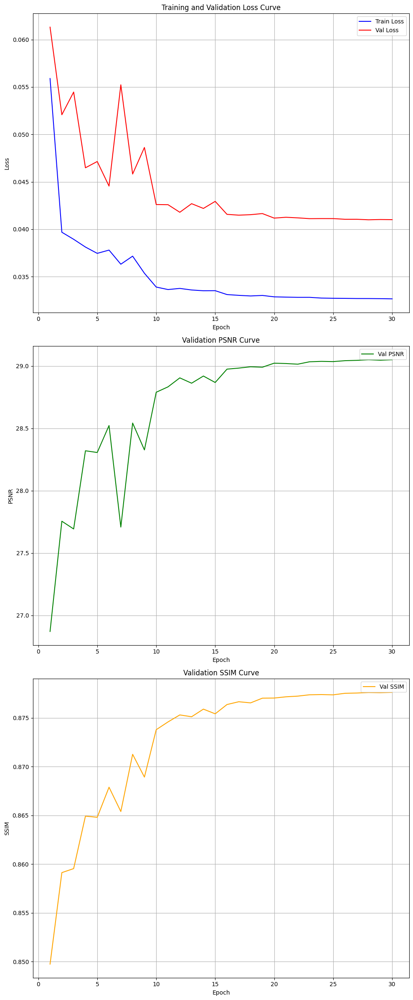

In [ ]:
train(srcnn_2, train_loader, val_loader, criterion_L1, 1e-3, 1e-5, num_epochs=30)

#### Evaluation and Visualization on Test Set

SRCNN 1

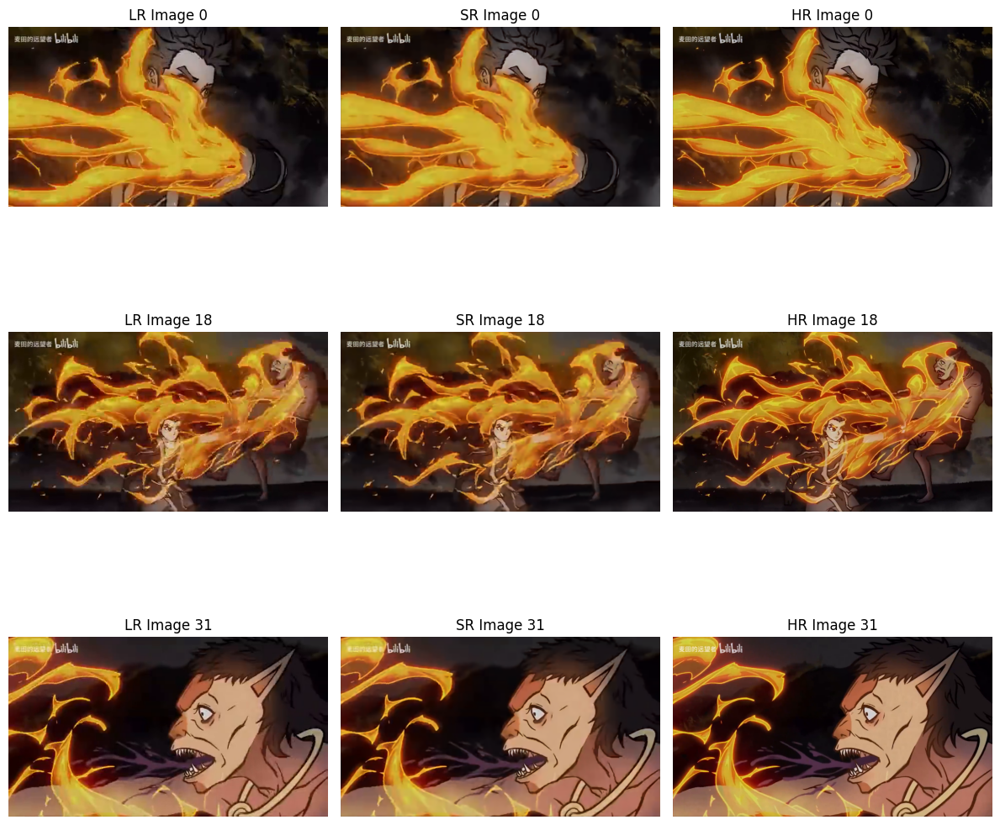

In [ ]:
best_model_sr = srcnn_1
best_model_sr.to(device)

# Load the best model
best_model_sr.load_state_dict(torch.load(f"best_model_{best_model_sr.name}.pth"))
visualize_lr_sr_hr(best_model_sr, test_loader, batch_index=0, image_indices=[0, 18, 31], num_images=3)

In [ ]:
evaluate(best_model_sr, test_loader, criterion_L1) # Loss, PSNR, SSIM

(0.03354966578384241,
 tensor(30.7146, device='cuda:0'),
 tensor(0.8978, device='cuda:0'))

SRCNN 2

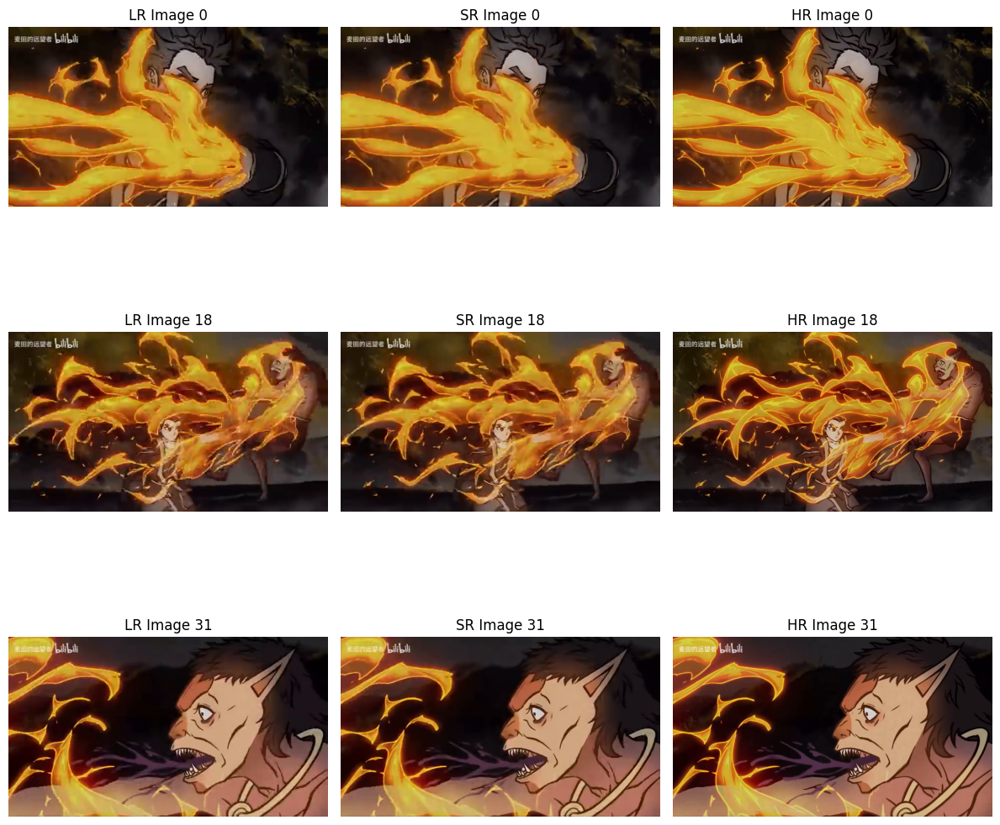

In [ ]:
best_model_sr = srcnn_2
best_model_sr.to(device)

# Load the best model
best_model_sr.load_state_dict(torch.load(f"best_model_{best_model_sr.name}.pth"))
visualize_lr_sr_hr(best_model_sr, test_loader, batch_index=0, image_indices=[0, 18, 31], num_images=3)

In [ ]:
evaluate(best_model_sr, test_loader, criterion_L1) # Loss, PSNR, SSIM

(0.033489298164134935,
 tensor(30.7439, device='cuda:0'),
 tensor(0.8983, device='cuda:0'))

## Model 2

### FSRCNN - Faster Super Resolution CNN<sup> [2]</sup>

![FSRCNN Model Architecture](https://miro.medium.com/v2/resize:fit:720/format:webp/1*4CegRjTO1LmRht7mTvBC_g.png)

#### For FSRCNN, the input image size is 320x640, SR is 1080x1920, and the HR is size 1080x1920, upscaling factor = 3 in FSRCNN architecture, no interpolation needed.

#### This is a customized FSRCNN with skip connection added to the architecture for further hyperparameter tuning

In [ ]:
class FSRCNN(nn.Module):
    def __init__(self, name, upscale_factor=3, d=56, s=12, m=4, residual=False):
        """
        FSRCNN model for super-resolution.

        Parameters:
        upscale_factor (int): Scaling factor (e.g., 2, 3, or 4), 3 here to rescale 360x640 to 1080x1920
        d (int): Number of feature maps in the first layer
        s (int): Number of shrinking layer filters
        m (int): Number of mapping layers
        residual (boolean): Add skip connection or not
        """
        super(FSRCNN, self).__init__()

        self.name = name
        self.residual = residual
        self.upscale_factor = upscale_factor

        # Feature Extraction
        self.feature_extraction = nn.Conv2d(3, d, kernel_size=5, stride=1, padding=2)

        # Shrinking
        self.shrinking = nn.Conv2d(d, s, kernel_size=1, stride=1, padding=0)

        # Mapping (Multiple Non-linear Convolutions)
        self.mapping = nn.Sequential(
            *[nn.Conv2d(s, s, kernel_size=3, stride=1, padding=1) for _ in range(m)]
        )

        # Expanding
        self.expanding = nn.Conv2d(s, d, kernel_size=1, stride=1, padding=0)

        # Deconvolution (Upscaling)
        self.deconv = nn.ConvTranspose2d(
            d, 3, kernel_size=9, stride=upscale_factor, padding=4, output_padding=upscale_factor - 1
        )

        # Final 1×1 Convolution (No Upscaling)
        #self.final_conv = nn.Conv2d(d, 3, kernel_size=1, stride=1, padding=0)

    def forward(self, x):

        if self.residual:
           residuals = interpolate(x, scale_factor=self.upscale_factor, mode='bicubic', align_corners=False)
        x = F.relu(self.feature_extraction(x))
        x = F.relu(self.shrinking(x))
        x = self.mapping(x)  # No activation here, non-linearity inside layers
        x = F.relu(self.expanding(x))
        x = self.deconv(x)

        #x = self.final_conv(x)

        #x = F.interpolate(x, size=(1080, 1920), mode='bicubic', align_corners=False)
        if self.residual:
           return x + residuals
        else:
           return x

#### FSRCNN Training (3 sets included in the report)

In [ ]:
train_dataset_fs, val_dataset_fs, test_dataset_fs, train_loader_fs, val_loader_fs, test_loader_fs = choose_model(32)

srcnn, fsrcnn, rfdn or r-esrgan:fsrcnn
The number of frames in training set is: 6150
The number of frames in testing set is: 1329
The number of frames in validation set is: 1329


##### Training and Hyperparameter Tuning

FSRCNN 1

Learning Rate 0.0001, Batch Size 32, Weight Decay 0, Skip Connections None, d 56, s 12, m 4, Epochs 40

In [ ]:
fsrcnn_1 = FSRCNN('fsrcnn_1')

Here, we overwrote the 30 epochs of training accidentally, so we decided to resume the progress for another 10 epochs by loading the best state.

In [ ]:
fsrcnn_1.load_state_dict(torch.load(f"best_model_fsrcnn_1.pth"))

<All keys matched successfully>

Epoch 1/10: 100%|██████████| 193/193 [02:45<00:00,  1.17it/s, Loss=0.0383]


Epoch 1/10, Train Loss: 0.03350, Val Loss: 0.04223, Val PSNR: 28.8321, Val SSIM: 0.8726, Latest LR: 0.0001000
Best model fsrcnn_1 saved!


Epoch 2/10: 100%|██████████| 193/193 [02:36<00:00,  1.24it/s, Loss=0.0323]


Epoch 2/10, Train Loss: 0.03341, Val Loss: 0.04228, Val PSNR: 28.8324, Val SSIM: 0.8727, Latest LR: 0.0001000
Best model fsrcnn_1 saved!


Epoch 3/10: 100%|██████████| 193/193 [02:29<00:00,  1.29it/s, Loss=0.0365]


Epoch 3/10, Train Loss: 0.03342, Val Loss: 0.04223, Val PSNR: 28.8400, Val SSIM: 0.8728, Latest LR: 0.0001000
Best model fsrcnn_1 saved!


Epoch 4/10: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0359]


Epoch 4/10, Train Loss: 0.03341, Val Loss: 0.04232, Val PSNR: 28.8347, Val SSIM: 0.8729, Latest LR: 0.0001000


Epoch 5/10: 100%|██████████| 193/193 [02:28<00:00,  1.30it/s, Loss=0.0335]


Epoch 5/10, Train Loss: 0.03340, Val Loss: 0.04223, Val PSNR: 28.8413, Val SSIM: 0.8729, Latest LR: 0.0001000
Best model fsrcnn_1 saved!


Epoch 6/10: 100%|██████████| 193/193 [02:29<00:00,  1.29it/s, Loss=0.0294]


Epoch 6/10, Train Loss: 0.03335, Val Loss: 0.04227, Val PSNR: 28.8432, Val SSIM: 0.8730, Latest LR: 0.0001000
Best model fsrcnn_1 saved!


Epoch 7/10: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0396]


Epoch 7/10, Train Loss: 0.03341, Val Loss: 0.04241, Val PSNR: 28.8387, Val SSIM: 0.8729, Latest LR: 0.0001000


Epoch 8/10: 100%|██████████| 193/193 [02:29<00:00,  1.29it/s, Loss=0.0336]


Epoch 8/10, Train Loss: 0.03337, Val Loss: 0.04220, Val PSNR: 28.8515, Val SSIM: 0.8731, Latest LR: 0.0001000
Best model fsrcnn_1 saved!


Epoch 9/10: 100%|██████████| 193/193 [02:28<00:00,  1.30it/s, Loss=0.0337]


Epoch 9/10, Train Loss: 0.03333, Val Loss: 0.04228, Val PSNR: 28.8497, Val SSIM: 0.8733, Latest LR: 0.0001000


Epoch 10/10: 100%|██████████| 193/193 [02:27<00:00,  1.30it/s, Loss=0.0334]


Epoch 10/10, Train Loss: 0.03332, Val Loss: 0.04213, Val PSNR: 28.8638, Val SSIM: 0.8733, Latest LR: 0.0001000
Best model fsrcnn_1 saved!


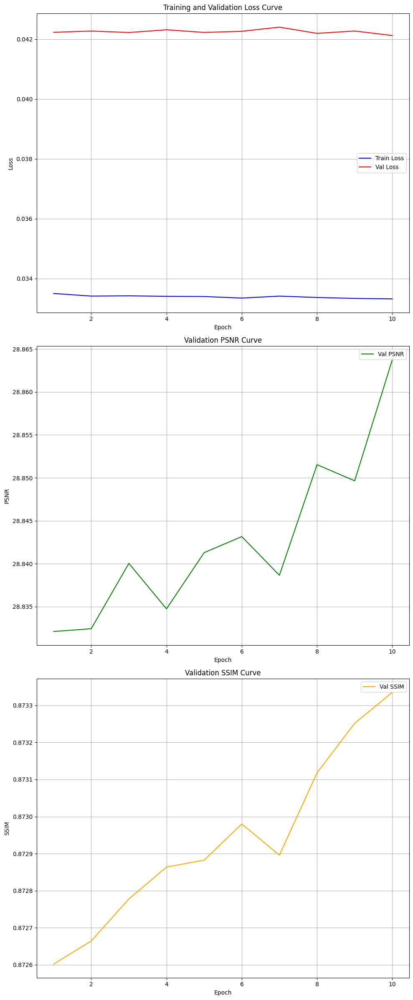

In [ ]:
train(fsrcnn_1, train_loader_fs, val_loader_fs, criterion_L1, 0.0001, 0, num_epochs=10)

FSRCNN 2

Learning Rate 0.001, Batch Size 32, Weight Decay 0, Skip Connections True, d 56, s 12, m 4, Epochs 40

In [ ]:
fsrcnn_2 = FSRCNN('fsrcnn_2', residual=True)

Epoch 1/40: 100%|██████████| 193/193 [02:28<00:00,  1.30it/s, Loss=0.0315]


Epoch 1/40, Train Loss: 0.03696, Val Loss: 0.04346, Val PSNR: 28.4766, Val SSIM: 0.8606, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 2/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0348]


Epoch 2/40, Train Loss: 0.03529, Val Loss: 0.04329, Val PSNR: 28.5273, Val SSIM: 0.8615, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 3/40: 100%|██████████| 193/193 [02:28<00:00,  1.30it/s, Loss=0.0375]


Epoch 3/40, Train Loss: 0.03497, Val Loss: 0.04286, Val PSNR: 28.6250, Val SSIM: 0.8641, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 4/40: 100%|██████████| 193/193 [02:27<00:00,  1.30it/s, Loss=0.0375]


Epoch 4/40, Train Loss: 0.03447, Val Loss: 0.04239, Val PSNR: 28.7313, Val SSIM: 0.8662, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 5/40: 100%|██████████| 193/193 [02:27<00:00,  1.30it/s, Loss=0.0351]


Epoch 5/40, Train Loss: 0.03404, Val Loss: 0.04214, Val PSNR: 28.7922, Val SSIM: 0.8678, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 6/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0316]


Epoch 6/40, Train Loss: 0.03376, Val Loss: 0.04189, Val PSNR: 28.8393, Val SSIM: 0.8692, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 7/40: 100%|██████████| 193/193 [02:28<00:00,  1.30it/s, Loss=0.0356]


Epoch 7/40, Train Loss: 0.03352, Val Loss: 0.04156, Val PSNR: 28.9051, Val SSIM: 0.8706, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 8/40: 100%|██████████| 193/193 [02:28<00:00,  1.30it/s, Loss=0.0276]


Epoch 8/40, Train Loss: 0.03328, Val Loss: 0.04132, Val PSNR: 28.9526, Val SSIM: 0.8719, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 9/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0271]


Epoch 9/40, Train Loss: 0.03308, Val Loss: 0.04103, Val PSNR: 29.0002, Val SSIM: 0.8731, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 10/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0391]


Epoch 10/40, Train Loss: 0.03299, Val Loss: 0.04100, Val PSNR: 29.0137, Val SSIM: 0.8735, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 11/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.03]


Epoch 11/40, Train Loss: 0.03284, Val Loss: 0.04085, Val PSNR: 29.0420, Val SSIM: 0.8744, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 12/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0316]


Epoch 12/40, Train Loss: 0.03271, Val Loss: 0.04091, Val PSNR: 29.0444, Val SSIM: 0.8750, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 13/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0344]


Epoch 13/40, Train Loss: 0.03268, Val Loss: 0.04074, Val PSNR: 29.0621, Val SSIM: 0.8752, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 14/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0347]


Epoch 14/40, Train Loss: 0.03260, Val Loss: 0.04074, Val PSNR: 29.0799, Val SSIM: 0.8761, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 15/40: 100%|██████████| 193/193 [02:25<00:00,  1.32it/s, Loss=0.0288]


Epoch 15/40, Train Loss: 0.03251, Val Loss: 0.04062, Val PSNR: 29.0877, Val SSIM: 0.8764, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 16/40: 100%|██████████| 193/193 [02:26<00:00,  1.32it/s, Loss=0.03]


Epoch 16/40, Train Loss: 0.03246, Val Loss: 0.04051, Val PSNR: 29.1070, Val SSIM: 0.8768, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 17/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0344]


Epoch 17/40, Train Loss: 0.03243, Val Loss: 0.04055, Val PSNR: 29.1070, Val SSIM: 0.8770, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 18/40: 100%|██████████| 193/193 [02:25<00:00,  1.32it/s, Loss=0.0359]


Epoch 18/40, Train Loss: 0.03239, Val Loss: 0.04085, Val PSNR: 29.0913, Val SSIM: 0.8766, Latest LR: 0.0010000


Epoch 19/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0299]


Epoch 19/40, Train Loss: 0.03234, Val Loss: 0.04053, Val PSNR: 29.1241, Val SSIM: 0.8775, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 20/40: 100%|██████████| 193/193 [02:26<00:00,  1.32it/s, Loss=0.0313]


Epoch 20/40, Train Loss: 0.03231, Val Loss: 0.04045, Val PSNR: 29.1238, Val SSIM: 0.8770, Latest LR: 0.0010000


Epoch 21/40: 100%|██████████| 193/193 [02:25<00:00,  1.33it/s, Loss=0.0316]


Epoch 21/40, Train Loss: 0.03226, Val Loss: 0.04029, Val PSNR: 29.1460, Val SSIM: 0.8778, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 22/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0313]


Epoch 22/40, Train Loss: 0.03224, Val Loss: 0.04039, Val PSNR: 29.1400, Val SSIM: 0.8778, Latest LR: 0.0010000


Epoch 23/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0352]


Epoch 23/40, Train Loss: 0.03223, Val Loss: 0.04025, Val PSNR: 29.1567, Val SSIM: 0.8780, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 24/40: 100%|██████████| 193/193 [02:26<00:00,  1.32it/s, Loss=0.0402]


Epoch 24/40, Train Loss: 0.03222, Val Loss: 0.04027, Val PSNR: 29.1551, Val SSIM: 0.8781, Latest LR: 0.0010000


Epoch 25/40: 100%|██████████| 193/193 [02:28<00:00,  1.30it/s, Loss=0.0332]


Epoch 25/40, Train Loss: 0.03217, Val Loss: 0.04030, Val PSNR: 29.1580, Val SSIM: 0.8782, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 26/40: 100%|██████████| 193/193 [02:26<00:00,  1.32it/s, Loss=0.038]


Epoch 26/40, Train Loss: 0.03216, Val Loss: 0.04012, Val PSNR: 29.1706, Val SSIM: 0.8787, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 27/40: 100%|██████████| 193/193 [02:26<00:00,  1.32it/s, Loss=0.0323]


Epoch 27/40, Train Loss: 0.03211, Val Loss: 0.04012, Val PSNR: 29.1778, Val SSIM: 0.8789, Latest LR: 0.0010000
Best model fsrcnn_2 saved!


Epoch 28/40: 100%|██████████| 193/193 [02:26<00:00,  1.32it/s, Loss=0.0305]


Epoch 28/40, Train Loss: 0.03209, Val Loss: 0.04012, Val PSNR: 29.1736, Val SSIM: 0.8788, Latest LR: 0.0010000


Epoch 29/40: 100%|██████████| 193/193 [02:26<00:00,  1.31it/s, Loss=0.0301]


Epoch 29/40, Train Loss: 0.03207, Val Loss: 0.04017, Val PSNR: 29.1743, Val SSIM: 0.8786, Latest LR: 0.0010000


Epoch 30/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0341]


Epoch 30/40, Train Loss: 0.03207, Val Loss: 0.04010, Val PSNR: 29.1800, Val SSIM: 0.8788, Latest LR: 0.0005000
Best model fsrcnn_2 saved!


Epoch 31/40: 100%|██████████| 193/193 [02:25<00:00,  1.32it/s, Loss=0.0308]


Epoch 31/40, Train Loss: 0.03198, Val Loss: 0.04006, Val PSNR: 29.1881, Val SSIM: 0.8791, Latest LR: 0.0005000
Best model fsrcnn_2 saved!


Epoch 32/40: 100%|██████████| 193/193 [02:26<00:00,  1.31it/s, Loss=0.0315]


Epoch 32/40, Train Loss: 0.03197, Val Loss: 0.04008, Val PSNR: 29.1841, Val SSIM: 0.8790, Latest LR: 0.0005000


Epoch 33/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0312]


Epoch 33/40, Train Loss: 0.03196, Val Loss: 0.04016, Val PSNR: 29.1829, Val SSIM: 0.8791, Latest LR: 0.0005000


Epoch 34/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0317]


Epoch 34/40, Train Loss: 0.03195, Val Loss: 0.04000, Val PSNR: 29.1958, Val SSIM: 0.8794, Latest LR: 0.0005000
Best model fsrcnn_2 saved!


Epoch 35/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.034]


Epoch 35/40, Train Loss: 0.03196, Val Loss: 0.04012, Val PSNR: 29.1842, Val SSIM: 0.8791, Latest LR: 0.0005000


Epoch 36/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0309]


Epoch 36/40, Train Loss: 0.03194, Val Loss: 0.04006, Val PSNR: 29.1905, Val SSIM: 0.8793, Latest LR: 0.0005000


Epoch 37/40: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0327]


Epoch 37/40, Train Loss: 0.03194, Val Loss: 0.04008, Val PSNR: 29.1844, Val SSIM: 0.8790, Latest LR: 0.0002500


Epoch 38/40: 100%|██████████| 193/193 [02:26<00:00,  1.32it/s, Loss=0.0313]


Epoch 38/40, Train Loss: 0.03190, Val Loss: 0.03995, Val PSNR: 29.2011, Val SSIM: 0.8795, Latest LR: 0.0002500
Best model fsrcnn_2 saved!


Epoch 39/40: 100%|██████████| 193/193 [02:25<00:00,  1.33it/s, Loss=0.027]


Epoch 39/40, Train Loss: 0.03187, Val Loss: 0.03997, Val PSNR: 29.2015, Val SSIM: 0.8795, Latest LR: 0.0002500
Best model fsrcnn_2 saved!


Epoch 40/40: 100%|██████████| 193/193 [02:24<00:00,  1.33it/s, Loss=0.0345]


Epoch 40/40, Train Loss: 0.03190, Val Loss: 0.04000, Val PSNR: 29.1982, Val SSIM: 0.8795, Latest LR: 0.0002500


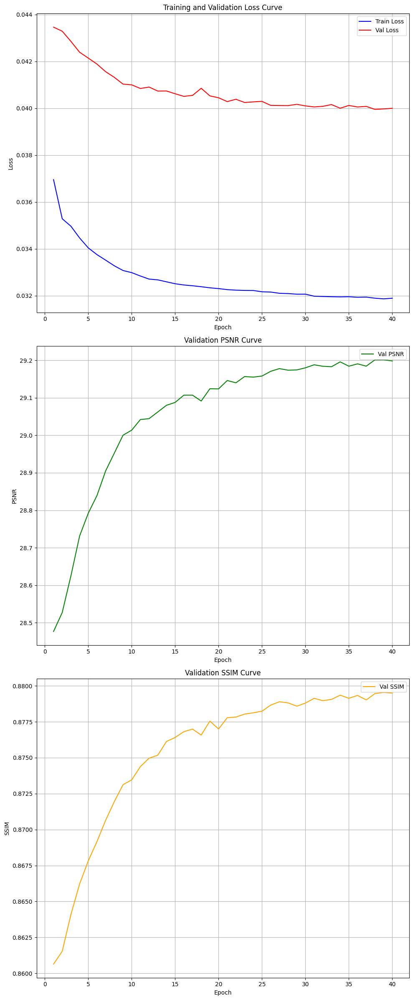

In [ ]:
train(fsrcnn_2, train_loader_fs, val_loader_fs, criterion_L1, 0.001, 0, num_epochs=40)

FSRCNN 3

Learning Rate 0.001, Batch Size 32, Weight Decay 0, Skip Connections True, d 64, s 12, m 4, Epochs 30

In [ ]:
# d s m tuning
fsrcnn_3 = FSRCNN('fsrcnn_3',d=64, residual=True)

Epoch 1/30: 100%|██████████| 193/193 [02:28<00:00,  1.30it/s, Loss=0.0323]


Epoch 1/30, Train Loss: 0.03675, Val Loss: 0.04342, Val PSNR: 28.4912, Val SSIM: 0.8616, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 2/30: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0289]


Epoch 2/30, Train Loss: 0.03523, Val Loss: 0.04333, Val PSNR: 28.5288, Val SSIM: 0.8621, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 3/30: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0327]


Epoch 3/30, Train Loss: 0.03491, Val Loss: 0.04299, Val PSNR: 28.6538, Val SSIM: 0.8645, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 4/30: 100%|██████████| 193/193 [02:26<00:00,  1.32it/s, Loss=0.0336]


Epoch 4/30, Train Loss: 0.03447, Val Loss: 0.04231, Val PSNR: 28.7677, Val SSIM: 0.8676, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 5/30: 100%|██████████| 193/193 [02:29<00:00,  1.30it/s, Loss=0.0365]


Epoch 5/30, Train Loss: 0.03395, Val Loss: 0.04193, Val PSNR: 28.8777, Val SSIM: 0.8700, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 6/30: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0312]


Epoch 6/30, Train Loss: 0.03348, Val Loss: 0.04155, Val PSNR: 28.9496, Val SSIM: 0.8722, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 7/30: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0337]


Epoch 7/30, Train Loss: 0.03322, Val Loss: 0.04130, Val PSNR: 29.0023, Val SSIM: 0.8736, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 8/30: 100%|██████████| 193/193 [02:30<00:00,  1.29it/s, Loss=0.035]


Epoch 8/30, Train Loss: 0.03301, Val Loss: 0.04106, Val PSNR: 29.0419, Val SSIM: 0.8745, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 9/30: 100%|██████████| 193/193 [02:27<00:00,  1.30it/s, Loss=0.0263]


Epoch 9/30, Train Loss: 0.03281, Val Loss: 0.04098, Val PSNR: 29.0555, Val SSIM: 0.8752, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 10/30: 100%|██████████| 193/193 [02:27<00:00,  1.30it/s, Loss=0.0317]


Epoch 10/30, Train Loss: 0.03275, Val Loss: 0.04076, Val PSNR: 29.0853, Val SSIM: 0.8759, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 11/30: 100%|██████████| 193/193 [02:28<00:00,  1.30it/s, Loss=0.0295]


Epoch 11/30, Train Loss: 0.03262, Val Loss: 0.04080, Val PSNR: 29.0855, Val SSIM: 0.8761, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 12/30: 100%|██████████| 193/193 [02:30<00:00,  1.28it/s, Loss=0.0339]


Epoch 12/30, Train Loss: 0.03257, Val Loss: 0.04061, Val PSNR: 29.1113, Val SSIM: 0.8767, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 13/30: 100%|██████████| 193/193 [02:28<00:00,  1.30it/s, Loss=0.0353]


Epoch 13/30, Train Loss: 0.03251, Val Loss: 0.04054, Val PSNR: 29.1228, Val SSIM: 0.8770, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 14/30: 100%|██████████| 193/193 [02:28<00:00,  1.30it/s, Loss=0.0302]


Epoch 14/30, Train Loss: 0.03242, Val Loss: 0.04048, Val PSNR: 29.1303, Val SSIM: 0.8773, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 15/30: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0301]


Epoch 15/30, Train Loss: 0.03239, Val Loss: 0.04059, Val PSNR: 29.1224, Val SSIM: 0.8772, Latest LR: 0.0010000


Epoch 16/30: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0305]


Epoch 16/30, Train Loss: 0.03233, Val Loss: 0.04035, Val PSNR: 29.1527, Val SSIM: 0.8779, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 17/30: 100%|██████████| 193/193 [02:26<00:00,  1.31it/s, Loss=0.0353]


Epoch 17/30, Train Loss: 0.03232, Val Loss: 0.04033, Val PSNR: 29.1593, Val SSIM: 0.8781, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 18/30: 100%|██████████| 193/193 [02:29<00:00,  1.29it/s, Loss=0.0272]


Epoch 18/30, Train Loss: 0.03224, Val Loss: 0.04032, Val PSNR: 29.1598, Val SSIM: 0.8784, Latest LR: 0.0010000
Best model fsrcnn_3 saved!


Epoch 19/30: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0297]


Epoch 19/30, Train Loss: 0.03222, Val Loss: 0.04034, Val PSNR: 29.1645, Val SSIM: 0.8783, Latest LR: 0.0005000
Best model fsrcnn_3 saved!


Epoch 20/30: 100%|██████████| 193/193 [02:26<00:00,  1.31it/s, Loss=0.0363]


Epoch 20/30, Train Loss: 0.03216, Val Loss: 0.04029, Val PSNR: 29.1702, Val SSIM: 0.8785, Latest LR: 0.0005000
Best model fsrcnn_3 saved!


Epoch 21/30: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.0338]


Epoch 21/30, Train Loss: 0.03213, Val Loss: 0.04022, Val PSNR: 29.1773, Val SSIM: 0.8787, Latest LR: 0.0005000
Best model fsrcnn_3 saved!


Epoch 22/30: 100%|██████████| 193/193 [02:26<00:00,  1.32it/s, Loss=0.033]


Epoch 22/30, Train Loss: 0.03212, Val Loss: 0.04021, Val PSNR: 29.1784, Val SSIM: 0.8788, Latest LR: 0.0002500
Best model fsrcnn_3 saved!


Epoch 23/30: 100%|██████████| 193/193 [02:27<00:00,  1.31it/s, Loss=0.031]


Epoch 23/30, Train Loss: 0.03206, Val Loss: 0.04013, Val PSNR: 29.1865, Val SSIM: 0.8788, Latest LR: 0.0002500
Best model fsrcnn_3 saved!


Epoch 24/30: 100%|██████████| 193/193 [02:28<00:00,  1.30it/s, Loss=0.0364]


Epoch 24/30, Train Loss: 0.03208, Val Loss: 0.04015, Val PSNR: 29.1859, Val SSIM: 0.8788, Latest LR: 0.0002500


Epoch 25/30: 100%|██████████| 193/193 [02:28<00:00,  1.30it/s, Loss=0.0309]


Epoch 25/30, Train Loss: 0.03205, Val Loss: 0.04012, Val PSNR: 29.1911, Val SSIM: 0.8790, Latest LR: 0.0002500
Best model fsrcnn_3 saved!


Epoch 26/30: 100%|██████████| 193/193 [02:29<00:00,  1.29it/s, Loss=0.0343]


Epoch 26/30, Train Loss: 0.03206, Val Loss: 0.04010, Val PSNR: 29.1904, Val SSIM: 0.8790, Latest LR: 0.0001250


Epoch 27/30: 100%|██████████| 193/193 [02:26<00:00,  1.32it/s, Loss=0.0313]


Epoch 27/30, Train Loss: 0.03202, Val Loss: 0.04011, Val PSNR: 29.1892, Val SSIM: 0.8789, Latest LR: 0.0001250


Epoch 28/30: 100%|██████████| 193/193 [02:28<00:00,  1.30it/s, Loss=0.0375]


Epoch 28/30, Train Loss: 0.03204, Val Loss: 0.04015, Val PSNR: 29.1865, Val SSIM: 0.8789, Latest LR: 0.0001250


Epoch 29/30: 100%|██████████| 193/193 [02:29<00:00,  1.30it/s, Loss=0.0355]


Epoch 29/30, Train Loss: 0.03203, Val Loss: 0.04012, Val PSNR: 29.1906, Val SSIM: 0.8789, Latest LR: 0.0000625


Epoch 30/30: 100%|██████████| 193/193 [02:29<00:00,  1.29it/s, Loss=0.0349]


Epoch 30/30, Train Loss: 0.03201, Val Loss: 0.04012, Val PSNR: 29.1911, Val SSIM: 0.8790, Latest LR: 0.0000625
Best model fsrcnn_3 saved!


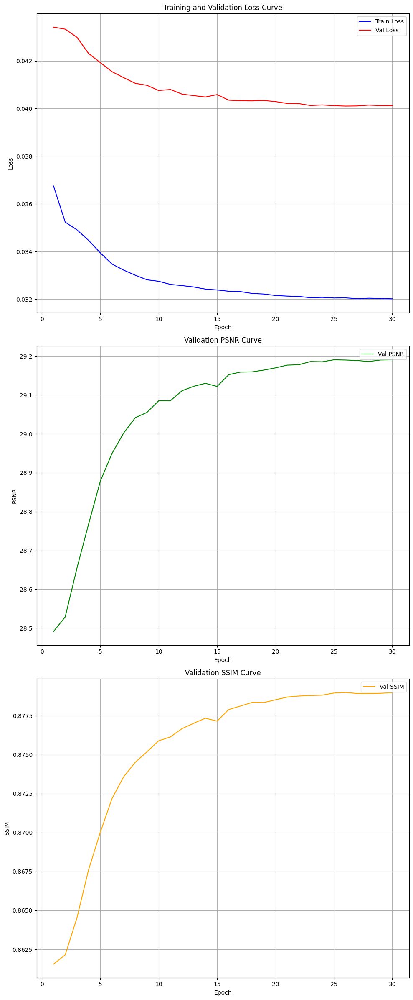

In [ ]:
train(fsrcnn_3, train_loader_fs, val_loader_fs, criterion_L1, 0.001, 0, num_epochs=30)

#### Evaluation and Visualization on Test Set

FSRCNN 1

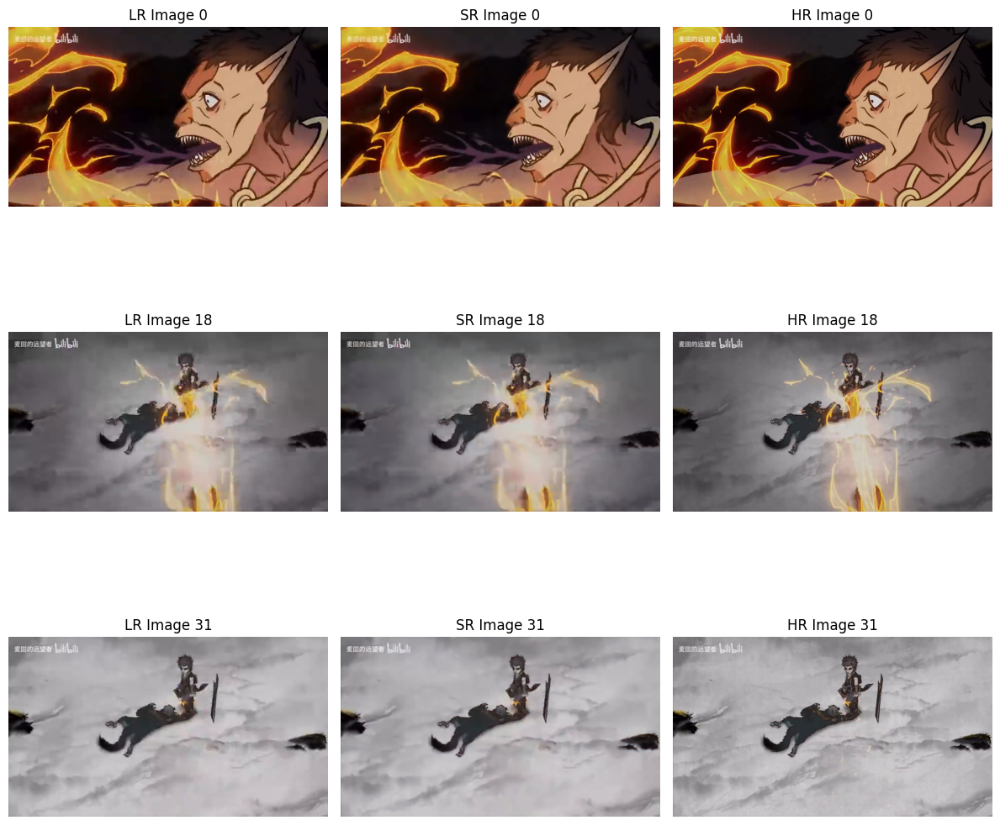

In [ ]:
model_fsrcnn = fsrcnn_1 # Choose the best FSRCNN
model_fsrcnn.to(device)

# Load the best fsrcnn model
model_fsrcnn.load_state_dict(torch.load(f"best_model_{model_fsrcnn.name}.pth"))
visualize_lr_sr_hr(model_fsrcnn, test_loader_fs, batch_index=1, image_indices=[0, 18, 31], num_images=3)

In [ ]:
# Best fsrcnn performance on test loader
evaluate(model_fsrcnn, test_loader_fs, criterion_L1)

(0.0349676583760551,
 tensor(30.3418, device='cuda:0'),
 tensor(0.8918, device='cuda:0'))

FSRCNN 2

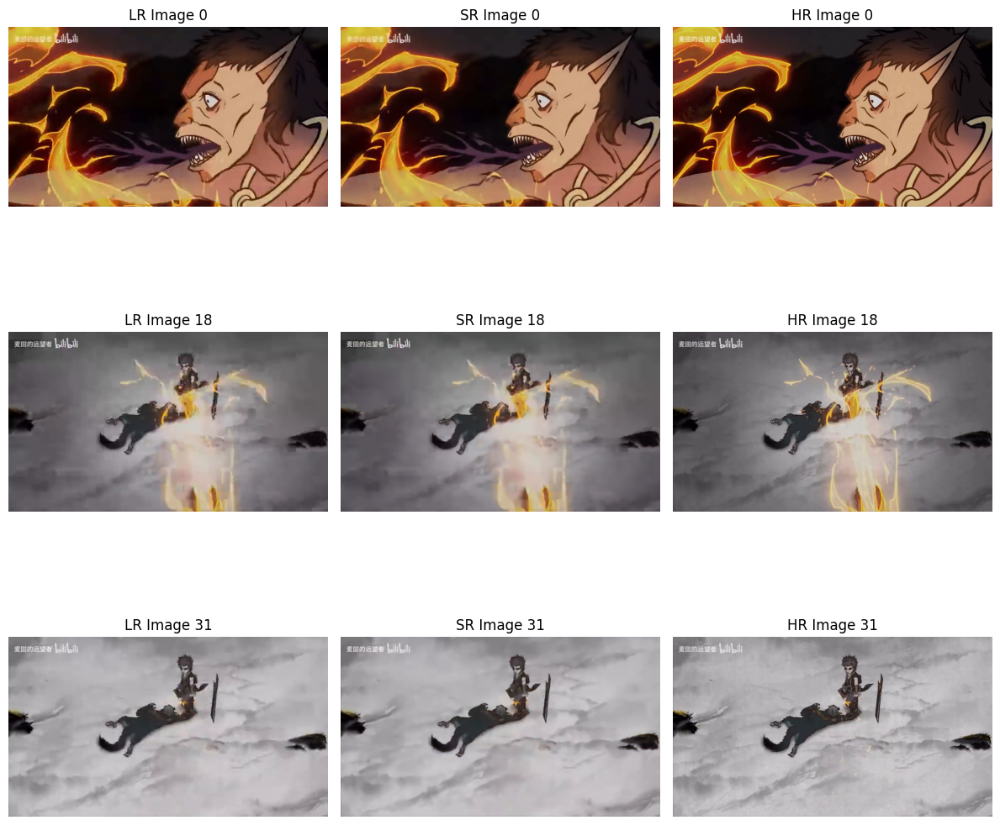

In [ ]:
model_fsrcnn = fsrcnn_2 # Choose the best FSRCNN
model_fsrcnn.to(device)

# Load the best fsrcnn model
model_fsrcnn.load_state_dict(torch.load(f"best_model_{model_fsrcnn.name}.pth"))
visualize_lr_sr_hr(model_fsrcnn, test_loader_fs, batch_index=1, image_indices=[0, 18, 31], num_images=3)

In [ ]:
evaluate(model_fsrcnn, test_loader_fs, criterion_L1)

(0.03271713808533691,
 tensor(30.8411, device='cuda:0'),
 tensor(0.8987, device='cuda:0'))

FSRCNN 3

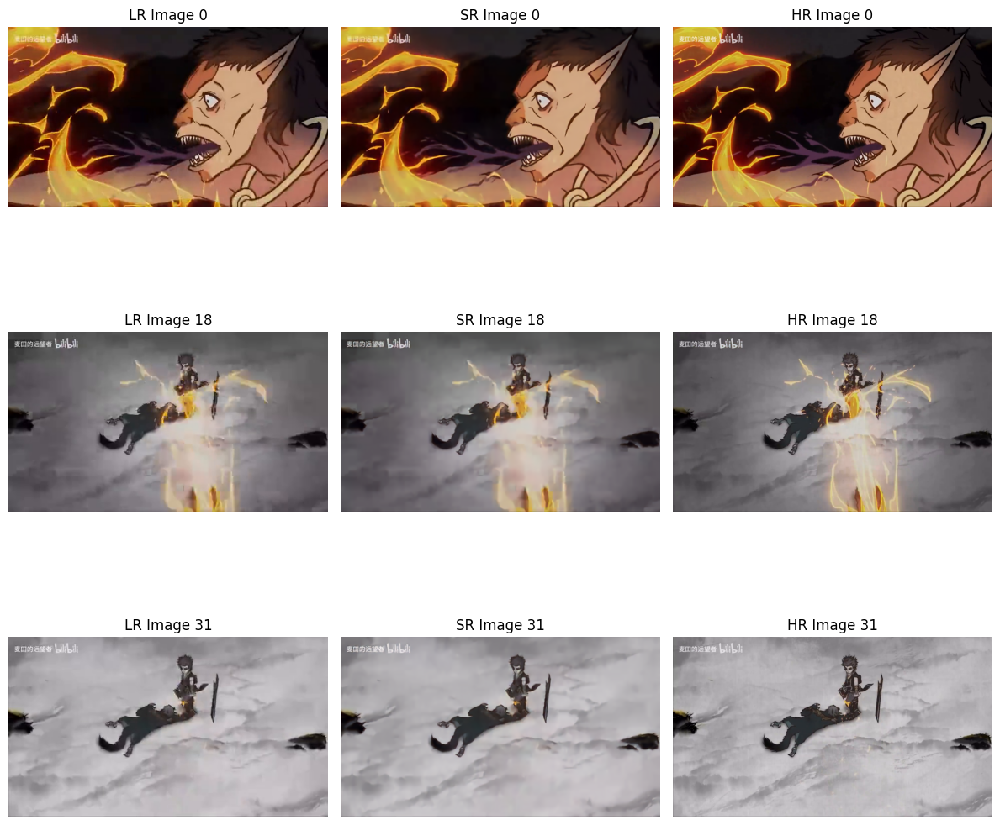

In [ ]:
model_fsrcnn = fsrcnn_3 # Choose the best FSRCNN
model_fsrcnn.to(device)

# Load the best fsrcnn model
model_fsrcnn.load_state_dict(torch.load(f"best_model_{model_fsrcnn.name}.pth"))
visualize_lr_sr_hr(model_fsrcnn, test_loader_fs, batch_index=1, image_indices=[0, 18, 31], num_images=3)

In [ ]:
evaluate(model_fsrcnn, test_loader_fs, criterion_L1)

(0.03292347357741424,
 tensor(30.8006, device='cuda:0'),
 tensor(0.8977, device='cuda:0'))

## Model 3

### RFDN (Residual Feature Distillation Network) <sup>[3]</sup>

![RFDN Model Architecture](https://www.mdpi.com/sensors/sensors-24-01049/article_deploy/html/images/sensors-24-01049-g001-550.jpg)

In [ ]:
class RFDB(nn.Module):
    """Residual Feature Distillation Block"""
    def __init__(self, in_channels):
        super(RFDB, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, in_channels, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels, in_channels, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(in_channels, in_channels, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(in_channels, in_channels, kernel_size=3, padding=1)

    def forward(self, x):
        out1 = F.relu(self.conv1(x))
        out2 = F.relu(self.conv2(out1))
        out3 = F.relu(self.conv3(out2))
        out4 = self.conv4(out3)
        return x + out4  # Residual Connection

class RFDN(nn.Module):
    """RFDN Super-Resolution Model"""
    def __init__(self, name, upscale_factor=3, num_blocks=4, num_channels=64):
        super(RFDN, self).__init__()
        self.name = name
        self.feature_extraction = nn.Conv2d(3, num_channels, kernel_size=3, padding=1)

        # Feature Distillation Blocks
        self.blocks = nn.Sequential(*[RFDB(num_channels) for _ in range(num_blocks)])

        # Global Feature Fusion
        self.global_fusion = nn.Conv2d(num_channels, num_channels, kernel_size=1)

        # Upsampling
        self.upsample = nn.Sequential(
            nn.Conv2d(num_channels, num_channels * (upscale_factor ** 2), kernel_size=3, padding=1),
            nn.PixelShuffle(upscale_factor),
            nn.Conv2d(num_channels, 3, kernel_size=3, padding=1)
        )

    def forward(self, x):
        x = self.feature_extraction(x)
        x = self.blocks(x)
        x = self.global_fusion(x)
        x = self.upsample(x)
        return x

#### RFDN Training (3 sets included in the report)

Batch Size Reduced to 8 and Num Workers Reduced to 6 (RAM Limitation)

In [ ]:
train_dataset_rf, val_dataset_rf, test_dataset_rf, train_loader_rf, val_loader_rf, test_loader_rf = choose_model(8, 6)

srcnn, fsrcnn, rfdn or r-esrgan:rfdn
The number of frames in training set is: 6150
The number of frames in testing set is: 1329
The number of frames in validation set is: 1329


##### Training and Hyperparameter Tuning

RFDN 1

Learning Rate 0.001, Batch Size 8, Weight Decay 0, Epochs 30, Optimizer Normal Adam

In [ ]:
rfdn_1 = RFDN('rfdn_1')

Epoch 1/30: 100%|██████████| 769/769 [03:11<00:00,  4.02it/s, Loss=0.0359]


Epoch 1/30, Train Loss: 0.04021, Val Loss: 0.04729, Val PSNR: 28.6441, Val SSIM: 0.8724, Latest LR: 0.0010000
Best model rfdn_1 saved!


Epoch 2/30: 100%|██████████| 769/769 [03:10<00:00,  4.04it/s, Loss=0.0342]


Epoch 2/30, Train Loss: 0.03406, Val Loss: 0.04085, Val PSNR: 29.2891, Val SSIM: 0.8826, Latest LR: 0.0010000
Best model rfdn_1 saved!


Epoch 3/30: 100%|██████████| 769/769 [03:09<00:00,  4.06it/s, Loss=0.0316]


Epoch 3/30, Train Loss: 0.03331, Val Loss: 0.04000, Val PSNR: 29.3920, Val SSIM: 0.8845, Latest LR: 0.0010000
Best model rfdn_1 saved!


Epoch 4/30: 100%|██████████| 769/769 [03:11<00:00,  4.03it/s, Loss=0.0316]


Epoch 4/30, Train Loss: 0.03256, Val Loss: 0.03952, Val PSNR: 29.4888, Val SSIM: 0.8854, Latest LR: 0.0010000
Best model rfdn_1 saved!


Epoch 5/30: 100%|██████████| 769/769 [03:11<00:00,  4.02it/s, Loss=0.032]


Epoch 5/30, Train Loss: 0.03196, Val Loss: 0.03968, Val PSNR: 29.5052, Val SSIM: 0.8865, Latest LR: 0.0010000
Best model rfdn_1 saved!


Epoch 6/30: 100%|██████████| 769/769 [03:06<00:00,  4.12it/s, Loss=0.0239]


Epoch 6/30, Train Loss: 0.03140, Val Loss: 0.03893, Val PSNR: 29.6030, Val SSIM: 0.8881, Latest LR: 0.0010000
Best model rfdn_1 saved!


Epoch 7/30: 100%|██████████| 769/769 [03:06<00:00,  4.13it/s, Loss=0.0363]


Epoch 7/30, Train Loss: 0.03120, Val Loss: 0.04023, Val PSNR: 29.4766, Val SSIM: 0.8854, Latest LR: 0.0010000


Epoch 8/30: 100%|██████████| 769/769 [03:07<00:00,  4.11it/s, Loss=0.0313]


Epoch 8/30, Train Loss: 0.03064, Val Loss: 0.03978, Val PSNR: 29.5629, Val SSIM: 0.8870, Latest LR: 0.0010000


Epoch 9/30: 100%|██████████| 769/769 [03:09<00:00,  4.06it/s, Loss=0.0322]


Epoch 9/30, Train Loss: 0.03061, Val Loss: 0.03897, Val PSNR: 29.6785, Val SSIM: 0.8897, Latest LR: 0.0010000
Best model rfdn_1 saved!


Epoch 10/30: 100%|██████████| 769/769 [03:05<00:00,  4.14it/s, Loss=0.0284]


Epoch 10/30, Train Loss: 0.03052, Val Loss: 0.04053, Val PSNR: 29.5801, Val SSIM: 0.8895, Latest LR: 0.0010000


Epoch 11/30: 100%|██████████| 769/769 [03:08<00:00,  4.09it/s, Loss=0.0308]


Epoch 11/30, Train Loss: 0.03001, Val Loss: 0.03820, Val PSNR: 29.7433, Val SSIM: 0.8905, Latest LR: 0.0010000
Best model rfdn_1 saved!


Epoch 12/30: 100%|██████████| 769/769 [03:07<00:00,  4.10it/s, Loss=0.033]


Epoch 12/30, Train Loss: 0.02998, Val Loss: 0.03805, Val PSNR: 29.7406, Val SSIM: 0.8904, Latest LR: 0.0010000


Epoch 13/30: 100%|██████████| 769/769 [03:07<00:00,  4.11it/s, Loss=0.026]


Epoch 13/30, Train Loss: 0.02971, Val Loss: 0.03784, Val PSNR: 29.7842, Val SSIM: 0.8910, Latest LR: 0.0010000
Best model rfdn_1 saved!


Epoch 14/30: 100%|██████████| 769/769 [03:05<00:00,  4.15it/s, Loss=0.0287]


Epoch 14/30, Train Loss: 0.02991, Val Loss: 0.03841, Val PSNR: 29.7297, Val SSIM: 0.8908, Latest LR: 0.0010000


Epoch 15/30: 100%|██████████| 769/769 [03:08<00:00,  4.08it/s, Loss=0.0365]


Epoch 15/30, Train Loss: 0.02950, Val Loss: 0.03823, Val PSNR: 29.7644, Val SSIM: 0.8909, Latest LR: 0.0010000


Epoch 16/30: 100%|██████████| 769/769 [03:06<00:00,  4.12it/s, Loss=0.0312]


Epoch 16/30, Train Loss: 0.02953, Val Loss: 0.03776, Val PSNR: 29.8096, Val SSIM: 0.8913, Latest LR: 0.0005000
Best model rfdn_1 saved!


Epoch 17/30: 100%|██████████| 769/769 [03:08<00:00,  4.09it/s, Loss=0.0307]


Epoch 17/30, Train Loss: 0.02855, Val Loss: 0.03736, Val PSNR: 29.8625, Val SSIM: 0.8924, Latest LR: 0.0005000
Best model rfdn_1 saved!


Epoch 18/30: 100%|██████████| 769/769 [03:09<00:00,  4.06it/s, Loss=0.0301]


Epoch 18/30, Train Loss: 0.02856, Val Loss: 0.03786, Val PSNR: 29.8183, Val SSIM: 0.8920, Latest LR: 0.0005000


Epoch 19/30: 100%|██████████| 769/769 [03:09<00:00,  4.06it/s, Loss=0.0378]


Epoch 19/30, Train Loss: 0.02866, Val Loss: 0.03747, Val PSNR: 29.8451, Val SSIM: 0.8923, Latest LR: 0.0005000


Epoch 20/30: 100%|██████████| 769/769 [03:04<00:00,  4.16it/s, Loss=0.0346]


Epoch 20/30, Train Loss: 0.02853, Val Loss: 0.03775, Val PSNR: 29.8194, Val SSIM: 0.8918, Latest LR: 0.0002500


Epoch 21/30: 100%|██████████| 769/769 [03:09<00:00,  4.06it/s, Loss=0.0273]


Epoch 21/30, Train Loss: 0.02813, Val Loss: 0.03747, Val PSNR: 29.8501, Val SSIM: 0.8925, Latest LR: 0.0002500


Epoch 22/30: 100%|██████████| 769/769 [03:10<00:00,  4.03it/s, Loss=0.03]


Epoch 22/30, Train Loss: 0.02815, Val Loss: 0.03752, Val PSNR: 29.8391, Val SSIM: 0.8923, Latest LR: 0.0002500


Epoch 23/30: 100%|██████████| 769/769 [03:12<00:00,  4.00it/s, Loss=0.0302]


Epoch 23/30, Train Loss: 0.02810, Val Loss: 0.03789, Val PSNR: 29.8098, Val SSIM: 0.8922, Latest LR: 0.0001250


Epoch 24/30: 100%|██████████| 769/769 [03:09<00:00,  4.06it/s, Loss=0.032]


Epoch 24/30, Train Loss: 0.02792, Val Loss: 0.03780, Val PSNR: 29.8330, Val SSIM: 0.8925, Latest LR: 0.0001250


Epoch 25/30: 100%|██████████| 769/769 [03:07<00:00,  4.11it/s, Loss=0.0282]


Epoch 25/30, Train Loss: 0.02792, Val Loss: 0.03780, Val PSNR: 29.8263, Val SSIM: 0.8924, Latest LR: 0.0001250


Epoch 26/30: 100%|██████████| 769/769 [03:10<00:00,  4.04it/s, Loss=0.0319]


Epoch 26/30, Train Loss: 0.02790, Val Loss: 0.03791, Val PSNR: 29.8153, Val SSIM: 0.8924, Latest LR: 0.0000625


Epoch 27/30: 100%|██████████| 769/769 [03:09<00:00,  4.06it/s, Loss=0.0324]


Epoch 27/30, Train Loss: 0.02781, Val Loss: 0.03832, Val PSNR: 29.7887, Val SSIM: 0.8925, Latest LR: 0.0000625


Epoch 28/30: 100%|██████████| 769/769 [03:09<00:00,  4.06it/s, Loss=0.0278]


Epoch 28/30, Train Loss: 0.02780, Val Loss: 0.03827, Val PSNR: 29.7865, Val SSIM: 0.8925, Latest LR: 0.0000625


Epoch 29/30: 100%|██████████| 769/769 [03:07<00:00,  4.10it/s, Loss=0.0295]


Epoch 29/30, Train Loss: 0.02780, Val Loss: 0.03841, Val PSNR: 29.7699, Val SSIM: 0.8924, Latest LR: 0.0000313


Epoch 30/30: 100%|██████████| 769/769 [03:07<00:00,  4.10it/s, Loss=0.0266]


Epoch 30/30, Train Loss: 0.02774, Val Loss: 0.03837, Val PSNR: 29.7764, Val SSIM: 0.8925, Latest LR: 0.0000313


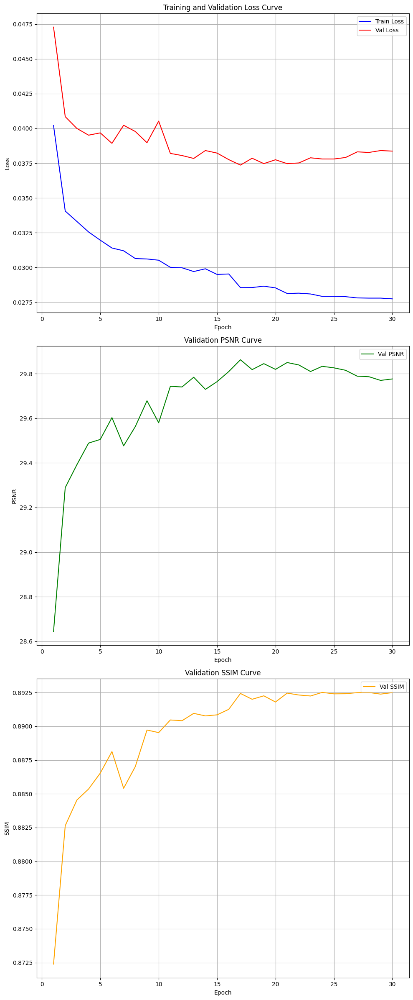

In [ ]:
train(rfdn_1, train_loader_rf, val_loader_rf, criterion_L1, 0.001, 0, num_epochs=30)

RFDN 2

Learning Rate 0.001, Batch Size 8, Weight Decay 5e-6, Epochs 35, Optimizer AdamW with Lookahead

Epoch 1/35: 100%|██████████| 769/769 [03:15<00:00,  3.93it/s, Loss=0.0362]


Epoch 1/35, Train Loss: 0.04058, Val Loss: 0.05528, Val PSNR: 27.7701, Val SSIM: 0.8642, Latest LR: 0.0010000
Best model rfdn_2 saved!


Epoch 2/35: 100%|██████████| 769/769 [03:10<00:00,  4.04it/s, Loss=0.0326]


Epoch 2/35, Train Loss: 0.03435, Val Loss: 0.04262, Val PSNR: 29.1203, Val SSIM: 0.8820, Latest LR: 0.0010000
Best model rfdn_2 saved!


Epoch 3/35: 100%|██████████| 769/769 [03:12<00:00,  3.99it/s, Loss=0.0319]


Epoch 3/35, Train Loss: 0.03297, Val Loss: 0.04178, Val PSNR: 29.2572, Val SSIM: 0.8815, Latest LR: 0.0010000
Best model rfdn_2 saved!


Epoch 4/35: 100%|██████████| 769/769 [03:12<00:00,  4.00it/s, Loss=0.0343]


Epoch 4/35, Train Loss: 0.03223, Val Loss: 0.03905, Val PSNR: 29.5192, Val SSIM: 0.8853, Latest LR: 0.0010000
Best model rfdn_2 saved!


Epoch 5/35: 100%|██████████| 769/769 [03:11<00:00,  4.01it/s, Loss=0.037]


Epoch 5/35, Train Loss: 0.03174, Val Loss: 0.03928, Val PSNR: 29.4701, Val SSIM: 0.8849, Latest LR: 0.0010000


Epoch 6/35: 100%|██████████| 769/769 [03:08<00:00,  4.07it/s, Loss=0.0333]


Epoch 6/35, Train Loss: 0.03125, Val Loss: 0.03920, Val PSNR: 29.5397, Val SSIM: 0.8872, Latest LR: 0.0010000
Best model rfdn_2 saved!


Epoch 7/35: 100%|██████████| 769/769 [03:09<00:00,  4.05it/s, Loss=0.03]


Epoch 7/35, Train Loss: 0.03090, Val Loss: 0.03881, Val PSNR: 29.6065, Val SSIM: 0.8886, Latest LR: 0.0010000
Best model rfdn_2 saved!


Epoch 8/35: 100%|██████████| 769/769 [03:12<00:00,  4.00it/s, Loss=0.0335]


Epoch 8/35, Train Loss: 0.03039, Val Loss: 0.04031, Val PSNR: 29.5271, Val SSIM: 0.8893, Latest LR: 0.0010000


Epoch 9/35: 100%|██████████| 769/769 [03:09<00:00,  4.07it/s, Loss=0.03]


Epoch 9/35, Train Loss: 0.03036, Val Loss: 0.03924, Val PSNR: 29.6008, Val SSIM: 0.8888, Latest LR: 0.0010000


Epoch 10/35: 100%|██████████| 769/769 [03:09<00:00,  4.05it/s, Loss=0.0268]


Epoch 10/35, Train Loss: 0.03028, Val Loss: 0.03852, Val PSNR: 29.6603, Val SSIM: 0.8880, Latest LR: 0.0010000
Best model rfdn_2 saved!


Epoch 11/35: 100%|██████████| 769/769 [03:11<00:00,  4.02it/s, Loss=0.0259]


Epoch 11/35, Train Loss: 0.02975, Val Loss: 0.03857, Val PSNR: 29.6905, Val SSIM: 0.8897, Latest LR: 0.0010000
Best model rfdn_2 saved!


Epoch 12/35: 100%|██████████| 769/769 [03:12<00:00,  4.00it/s, Loss=0.0304]


Epoch 12/35, Train Loss: 0.02975, Val Loss: 0.03799, Val PSNR: 29.7707, Val SSIM: 0.8910, Latest LR: 0.0010000
Best model rfdn_2 saved!


Epoch 13/35: 100%|██████████| 769/769 [03:05<00:00,  4.14it/s, Loss=0.0237]


Epoch 13/35, Train Loss: 0.02957, Val Loss: 0.03796, Val PSNR: 29.7804, Val SSIM: 0.8911, Latest LR: 0.0010000
Best model rfdn_2 saved!


Epoch 14/35: 100%|██████████| 769/769 [03:10<00:00,  4.04it/s, Loss=0.028]


Epoch 14/35, Train Loss: 0.02936, Val Loss: 0.03795, Val PSNR: 29.8022, Val SSIM: 0.8914, Latest LR: 0.0010000
Best model rfdn_2 saved!


Epoch 15/35: 100%|██████████| 769/769 [03:10<00:00,  4.04it/s, Loss=0.0265]


Epoch 15/35, Train Loss: 0.02930, Val Loss: 0.03748, Val PSNR: 29.8399, Val SSIM: 0.8919, Latest LR: 0.0010000
Best model rfdn_2 saved!


Epoch 16/35: 100%|██████████| 769/769 [03:06<00:00,  4.12it/s, Loss=0.0285]


Epoch 16/35, Train Loss: 0.02947, Val Loss: 0.03811, Val PSNR: 29.7651, Val SSIM: 0.8916, Latest LR: 0.0010000


Epoch 17/35: 100%|██████████| 769/769 [03:06<00:00,  4.12it/s, Loss=0.0288]


Epoch 17/35, Train Loss: 0.02908, Val Loss: 0.03834, Val PSNR: 29.7534, Val SSIM: 0.8917, Latest LR: 0.0010000


Epoch 18/35: 100%|██████████| 769/769 [03:07<00:00,  4.10it/s, Loss=0.0307]


Epoch 18/35, Train Loss: 0.02895, Val Loss: 0.04026, Val PSNR: 29.5688, Val SSIM: 0.8898, Latest LR: 0.0005000


Epoch 19/35: 100%|██████████| 769/769 [03:09<00:00,  4.07it/s, Loss=0.0276]


Epoch 19/35, Train Loss: 0.02825, Val Loss: 0.03745, Val PSNR: 29.8570, Val SSIM: 0.8927, Latest LR: 0.0005000
Best model rfdn_2 saved!


Epoch 20/35: 100%|██████████| 769/769 [03:09<00:00,  4.05it/s, Loss=0.0287]


Epoch 20/35, Train Loss: 0.02828, Val Loss: 0.03732, Val PSNR: 29.8760, Val SSIM: 0.8930, Latest LR: 0.0005000
Best model rfdn_2 saved!


Epoch 21/35: 100%|██████████| 769/769 [03:10<00:00,  4.05it/s, Loss=0.0322]


Epoch 21/35, Train Loss: 0.02828, Val Loss: 0.03756, Val PSNR: 29.8520, Val SSIM: 0.8924, Latest LR: 0.0005000


Epoch 22/35: 100%|██████████| 769/769 [03:07<00:00,  4.10it/s, Loss=0.0264]


Epoch 22/35, Train Loss: 0.02827, Val Loss: 0.03751, Val PSNR: 29.8532, Val SSIM: 0.8925, Latest LR: 0.0005000


Epoch 23/35: 100%|██████████| 769/769 [03:08<00:00,  4.08it/s, Loss=0.0349]


Epoch 23/35, Train Loss: 0.02820, Val Loss: 0.03745, Val PSNR: 29.8454, Val SSIM: 0.8927, Latest LR: 0.0002500


Epoch 24/35: 100%|██████████| 769/769 [03:11<00:00,  4.02it/s, Loss=0.0278]


Epoch 24/35, Train Loss: 0.02787, Val Loss: 0.03720, Val PSNR: 29.8863, Val SSIM: 0.8931, Latest LR: 0.0002500
Best model rfdn_2 saved!


Epoch 25/35: 100%|██████████| 769/769 [03:07<00:00,  4.10it/s, Loss=0.028]


Epoch 25/35, Train Loss: 0.02789, Val Loss: 0.03753, Val PSNR: 29.8628, Val SSIM: 0.8928, Latest LR: 0.0002500


Epoch 26/35: 100%|██████████| 769/769 [03:06<00:00,  4.12it/s, Loss=0.0294]


Epoch 26/35, Train Loss: 0.02788, Val Loss: 0.03734, Val PSNR: 29.8714, Val SSIM: 0.8929, Latest LR: 0.0001250


Epoch 27/35: 100%|██████████| 769/769 [03:06<00:00,  4.12it/s, Loss=0.0318]


Epoch 27/35, Train Loss: 0.02775, Val Loss: 0.03736, Val PSNR: 29.8771, Val SSIM: 0.8931, Latest LR: 0.0001250


Epoch 28/35: 100%|██████████| 769/769 [03:13<00:00,  3.98it/s, Loss=0.0231]


Epoch 28/35, Train Loss: 0.02773, Val Loss: 0.03742, Val PSNR: 29.8706, Val SSIM: 0.8930, Latest LR: 0.0001250


Epoch 29/35: 100%|██████████| 769/769 [03:07<00:00,  4.11it/s, Loss=0.0303]


Epoch 29/35, Train Loss: 0.02774, Val Loss: 0.03735, Val PSNR: 29.8731, Val SSIM: 0.8930, Latest LR: 0.0000625


Epoch 30/35: 100%|██████████| 769/769 [03:09<00:00,  4.06it/s, Loss=0.0244]


Epoch 30/35, Train Loss: 0.02767, Val Loss: 0.03758, Val PSNR: 29.8573, Val SSIM: 0.8930, Latest LR: 0.0000625


Epoch 31/35: 100%|██████████| 769/769 [03:09<00:00,  4.06it/s, Loss=0.0291]


Epoch 31/35, Train Loss: 0.02767, Val Loss: 0.03757, Val PSNR: 29.8595, Val SSIM: 0.8930, Latest LR: 0.0000625


Epoch 32/35: 100%|██████████| 769/769 [03:08<00:00,  4.08it/s, Loss=0.0216]


Epoch 32/35, Train Loss: 0.02766, Val Loss: 0.03757, Val PSNR: 29.8592, Val SSIM: 0.8930, Latest LR: 0.0000313


Epoch 33/35: 100%|██████████| 769/769 [03:10<00:00,  4.04it/s, Loss=0.0294]


Epoch 33/35, Train Loss: 0.02763, Val Loss: 0.03767, Val PSNR: 29.8504, Val SSIM: 0.8930, Latest LR: 0.0000313


Epoch 34/35: 100%|██████████| 769/769 [03:13<00:00,  3.98it/s, Loss=0.0287]


Epoch 34/35, Train Loss: 0.02763, Val Loss: 0.03770, Val PSNR: 29.8428, Val SSIM: 0.8930, Latest LR: 0.0000313


Epoch 35/35: 100%|██████████| 769/769 [03:08<00:00,  4.07it/s, Loss=0.0267]


Epoch 35/35, Train Loss: 0.02762, Val Loss: 0.03757, Val PSNR: 29.8592, Val SSIM: 0.8931, Latest LR: 0.0000156


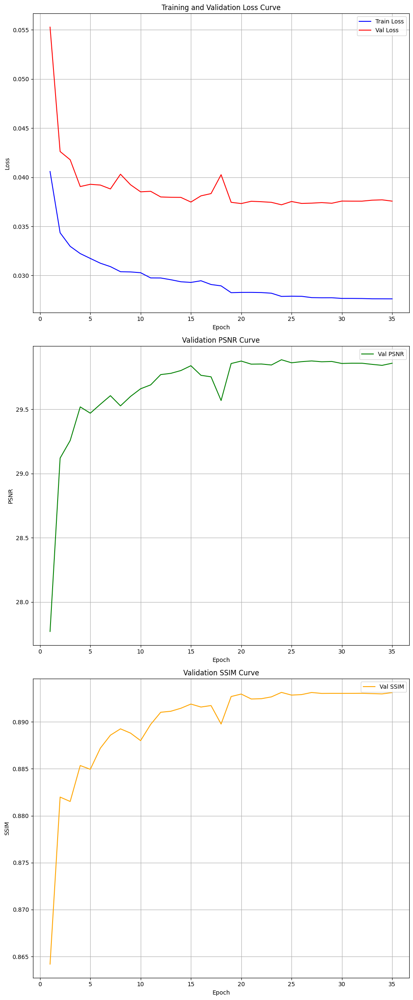

In [ ]:
rfdn_2 = RFDN('rfdn_2')
train(rfdn_2, train_loader_rf, val_loader_rf, criterion_L1, 0.001, 5e-6, num_epochs=35, optim_method='adamw')

RFDN 3

Learning Rate 0.0001, Batch Size 8, Weight Decay 0, Epochs 20, Optimizer Normal Adam, Num Blocks 3

Epoch 1/20: 100%|██████████| 769/769 [03:08<00:00,  4.09it/s, Loss=0.0337]


Epoch 1/20, Train Loss: 0.04650, Val Loss: 0.04415, Val PSNR: 28.3365, Val SSIM: 0.8632, Latest LR: 0.0001000
Best model rfdn_3 saved!


Epoch 2/20: 100%|██████████| 769/769 [03:02<00:00,  4.22it/s, Loss=0.034]


Epoch 2/20, Train Loss: 0.03461, Val Loss: 0.04206, Val PSNR: 28.7674, Val SSIM: 0.8705, Latest LR: 0.0001000
Best model rfdn_3 saved!


Epoch 3/20: 100%|██████████| 769/769 [03:07<00:00,  4.10it/s, Loss=0.0329]


Epoch 3/20, Train Loss: 0.03343, Val Loss: 0.04129, Val PSNR: 28.9947, Val SSIM: 0.8761, Latest LR: 0.0001000
Best model rfdn_3 saved!


Epoch 4/20: 100%|██████████| 769/769 [03:04<00:00,  4.17it/s, Loss=0.0354]


Epoch 4/20, Train Loss: 0.03273, Val Loss: 0.04091, Val PSNR: 29.1023, Val SSIM: 0.8786, Latest LR: 0.0001000
Best model rfdn_3 saved!


Epoch 5/20: 100%|██████████| 769/769 [03:05<00:00,  4.15it/s, Loss=0.0317]


Epoch 5/20, Train Loss: 0.03224, Val Loss: 0.04052, Val PSNR: 29.1841, Val SSIM: 0.8804, Latest LR: 0.0001000
Best model rfdn_3 saved!


Epoch 6/20: 100%|██████████| 769/769 [03:05<00:00,  4.15it/s, Loss=0.0349]


Epoch 6/20, Train Loss: 0.03191, Val Loss: 0.04006, Val PSNR: 29.2618, Val SSIM: 0.8822, Latest LR: 0.0001000
Best model rfdn_3 saved!


Epoch 7/20: 100%|██████████| 769/769 [03:05<00:00,  4.16it/s, Loss=0.0307]


Epoch 7/20, Train Loss: 0.03156, Val Loss: 0.03948, Val PSNR: 29.3536, Val SSIM: 0.8836, Latest LR: 0.0001000
Best model rfdn_3 saved!


Epoch 8/20: 100%|██████████| 769/769 [03:05<00:00,  4.15it/s, Loss=0.0295]


Epoch 8/20, Train Loss: 0.03132, Val Loss: 0.03988, Val PSNR: 29.3479, Val SSIM: 0.8838, Latest LR: 0.0001000


Epoch 9/20: 100%|██████████| 769/769 [03:06<00:00,  4.13it/s, Loss=0.0357]


Epoch 9/20, Train Loss: 0.03106, Val Loss: 0.03914, Val PSNR: 29.4191, Val SSIM: 0.8850, Latest LR: 0.0001000
Best model rfdn_3 saved!


Epoch 10/20: 100%|██████████| 769/769 [03:08<00:00,  4.08it/s, Loss=0.032]


Epoch 10/20, Train Loss: 0.03088, Val Loss: 0.03897, Val PSNR: 29.4573, Val SSIM: 0.8857, Latest LR: 0.0001000
Best model rfdn_3 saved!


Epoch 11/20: 100%|██████████| 769/769 [03:06<00:00,  4.12it/s, Loss=0.027]


Epoch 11/20, Train Loss: 0.03072, Val Loss: 0.03913, Val PSNR: 29.4683, Val SSIM: 0.8860, Latest LR: 0.0001000
Best model rfdn_3 saved!


Epoch 12/20: 100%|██████████| 769/769 [03:08<00:00,  4.08it/s, Loss=0.0306]


Epoch 12/20, Train Loss: 0.03054, Val Loss: 0.03866, Val PSNR: 29.5153, Val SSIM: 0.8867, Latest LR: 0.0001000
Best model rfdn_3 saved!


Epoch 13/20: 100%|██████████| 769/769 [03:10<00:00,  4.04it/s, Loss=0.0283]


Epoch 13/20, Train Loss: 0.03040, Val Loss: 0.03884, Val PSNR: 29.5126, Val SSIM: 0.8868, Latest LR: 0.0001000


Epoch 14/20: 100%|██████████| 769/769 [03:06<00:00,  4.12it/s, Loss=0.0391]


Epoch 14/20, Train Loss: 0.03028, Val Loss: 0.03852, Val PSNR: 29.5372, Val SSIM: 0.8871, Latest LR: 0.0001000
Best model rfdn_3 saved!


Epoch 15/20: 100%|██████████| 769/769 [03:06<00:00,  4.11it/s, Loss=0.0244]


Epoch 15/20, Train Loss: 0.03023, Val Loss: 0.03862, Val PSNR: 29.5424, Val SSIM: 0.8877, Latest LR: 0.0000500
Best model rfdn_3 saved!


Epoch 16/20: 100%|██████████| 769/769 [03:05<00:00,  4.14it/s, Loss=0.0309]


Epoch 16/20, Train Loss: 0.02985, Val Loss: 0.03825, Val PSNR: 29.5843, Val SSIM: 0.8882, Latest LR: 0.0000500
Best model rfdn_3 saved!


Epoch 17/20: 100%|██████████| 769/769 [03:07<00:00,  4.10it/s, Loss=0.0294]


Epoch 17/20, Train Loss: 0.02983, Val Loss: 0.03826, Val PSNR: 29.5852, Val SSIM: 0.8883, Latest LR: 0.0000500
Best model rfdn_3 saved!


Epoch 18/20: 100%|██████████| 769/769 [03:01<00:00,  4.24it/s, Loss=0.0305]


Epoch 18/20, Train Loss: 0.02978, Val Loss: 0.03834, Val PSNR: 29.5960, Val SSIM: 0.8884, Latest LR: 0.0000500
Best model rfdn_3 saved!


Epoch 19/20: 100%|██████████| 769/769 [03:05<00:00,  4.14it/s, Loss=0.0289]


Epoch 19/20, Train Loss: 0.02974, Val Loss: 0.03806, Val PSNR: 29.6195, Val SSIM: 0.8887, Latest LR: 0.0000500
Best model rfdn_3 saved!


Epoch 20/20: 100%|██████████| 769/769 [03:07<00:00,  4.09it/s, Loss=0.0317]


Epoch 20/20, Train Loss: 0.02967, Val Loss: 0.03813, Val PSNR: 29.6193, Val SSIM: 0.8888, Latest LR: 0.0000500


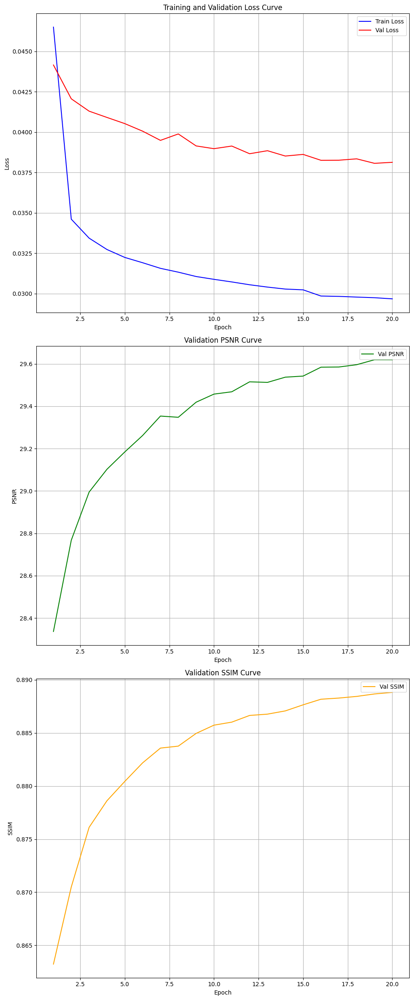

In [ ]:
rfdn_3 = RFDN('rfdn_3', num_blocks=3)
train(rfdn_3, train_loader_rf, val_loader_rf, criterion_L1, 0.0001, 0, num_epochs=20)

#### Evaluation and Visualization on Test Set

RFDN 2

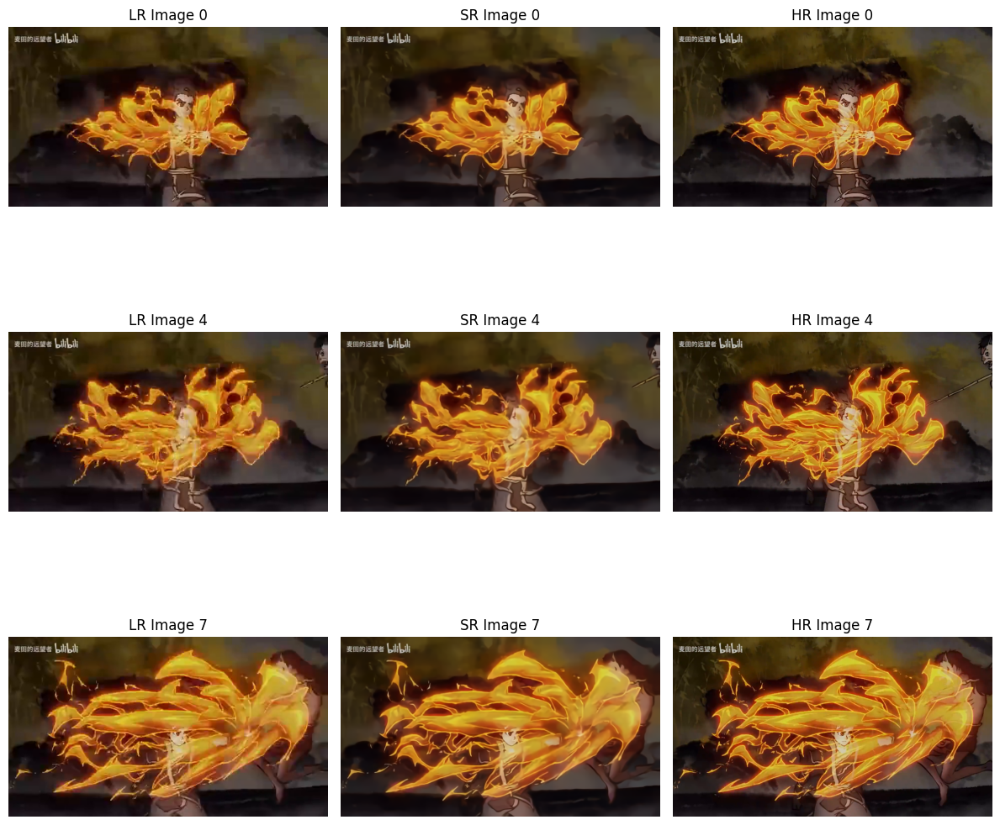

In [ ]:
model_rfdn = rfdn_2 # Choose the best FSRCNN
model_rfdn.to(device)

# Load the best fsrcnn model
model_rfdn.load_state_dict(torch.load(f"best_model_{model_rfdn.name}.pth"))
visualize_lr_sr_hr(model_rfdn, test_loader_rf, batch_index=1, image_indices=[0, 4, 7], num_images=3)

In [ ]:
evaluate(model_rfdn, test_loader_rf, criterion_L1)

(0.03147026639944779,
 tensor(31.3755, device='cuda:0'),
 tensor(0.9073, device='cuda:0'))

RFDN 1

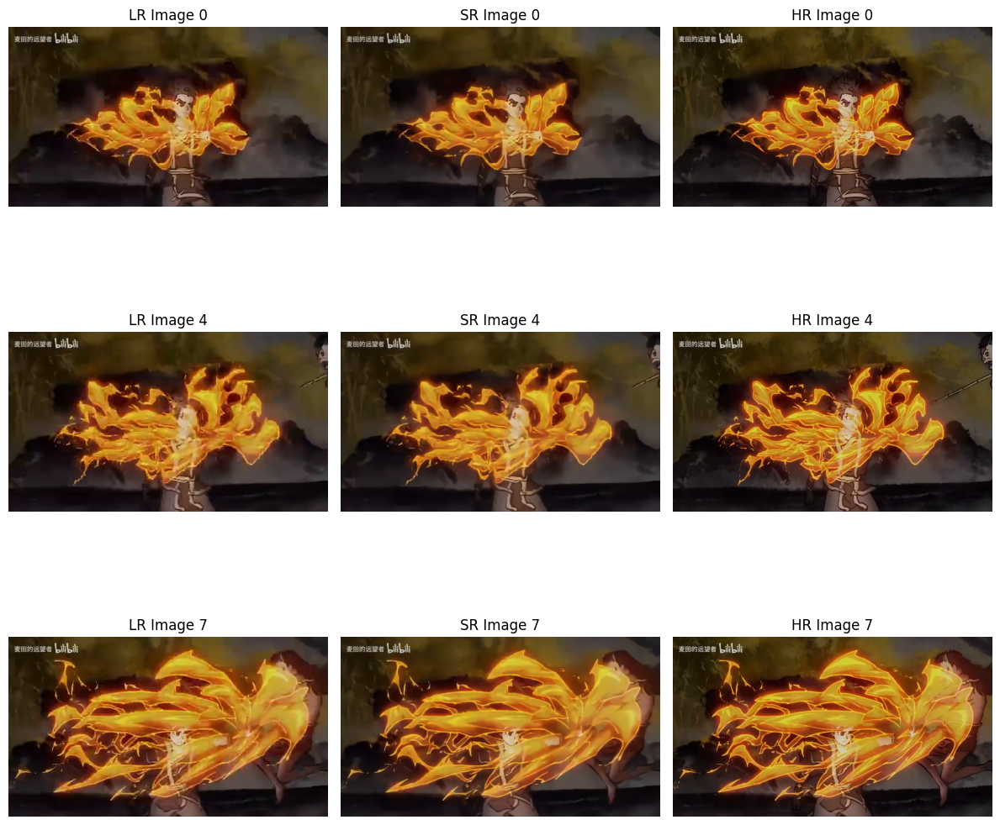

In [ ]:
model_rfdn = rfdn_1 # Choose the best FSRCNN
model_rfdn.to(device)

# Load the best fsrcnn model
model_rfdn.load_state_dict(torch.load(f"best_model_{model_rfdn.name}.pth"))
visualize_lr_sr_hr(model_rfdn, test_loader_rf, batch_index=1, image_indices=[0, 4, 7], num_images=3)

In [ ]:
evaluate(model_rfdn, test_loader_rf, criterion_L1)

(0.031207411209801715,
 tensor(31.4845, device='cuda:0'),
 tensor(0.9081, device='cuda:0'))

## Model 4
### Due to the RAM limitation, we decided not to implement Model 4, which is Real-ESRGAN. However, the following part will be kept and used as a reference.

In [ ]:
!pip install realesrgan

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.5/172.5 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 16.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.6/59.6 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.2/52.2 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.8/297.8 kB 29.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 86.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.2/256.2 kB 29.1 MB/s eta 0:00:00
  Created wheel for basicsr: filename=basicsr-1.4.2-py3-none-any.whl size=214818 sha256=e59e473dd1bfca44751e2fd825dd5f0c465c6f9a0f6d3e06f9885cf808bce604
  Stored in directory: /root/.cache/pip/wheels/6d/a4/b3/9f888ba88efcae6dd4bbce69832363de9c4051142674f779fa
  Created wheel fo

#### Modify one line of code in basicsr lib or import error will occur
##### Click Files Icon, locate \usr\local\lib\python3.11(or latest python version)\dist-packages\basicsr\data\degradations.py, then double click it, find the line 'from torchvision.transforms.functional_tensor import rgb_to_grayscale' and change it to 'from torchvision.transforms.functional import rgb_to_grayscale', then execute the next line of code in our notebook. The import line should work and now you can close the degradations.py file.

### Real ESRGAN (Transfer Learning) <sup>[4]</sup>

In [ ]:
from realesrgan import RealESRGANer
from basicsr.archs.rrdbnet_arch import RRDBNet
from basicsr.archs.srvgg_arch import SRVGGNetCompact
from basicsr.archs.discriminator_arch import UNetDiscriminatorSN

#### For ESRGAN, the input image size is 270x480, both SR and HR will be the original size 1080x1920, since we will apply the upscaling factor = 4 directly in ESRGAN architecture, thus, no more interpolation is required after the model training is completed.

The pretrained model weights can be found [here](https://github.com/xinntao/Real-ESRGAN/releases/download/v0.2.2.4/RealESRGAN_x4plus_anime_6B.pth)

In [ ]:
# Build Discriminator (The architecture is similar to UNetDiscriminatorSN in Real-Esrgan)
from torch.nn.utils import spectral_norm

class UNetDiscriminatorSN(nn.Module):
    """Defines a U-Net discriminator with spectral normalization (SN)

    It is used in Real-ESRGAN: Training Real-World Blind Super-Resolution with Pure Synthetic Data.

    Arg:
        num_in_ch (int): Channel number of inputs. Default: 3.
        num_feat (int): Channel number of base intermediate features. Default: 64.
        skip_connection (bool): Whether to use skip connections between U-Net. Default: True.
    """

    def __init__(self, name, num_in_ch, num_feat=64, skip_connection=True):
        super(UNetDiscriminatorSN, self).__init__()
        self.skip_connection = skip_connection
        norm = spectral_norm

        self.name = name

        # the first convolution
        self.conv0 = nn.Conv2d(num_in_ch, num_feat, kernel_size=3, stride=1, padding=1)
        # downsample
        self.conv1 = norm(nn.Conv2d(num_feat, num_feat * 2, 4, 2, 1, bias=False))
        self.conv2 = norm(nn.Conv2d(num_feat * 2, num_feat * 4, 4, 2, 1, bias=False))
        self.conv3 = norm(nn.Conv2d(num_feat * 4, num_feat * 8, 4, 2, 1, bias=False))
        # upsample
        self.conv4 = norm(nn.Conv2d(num_feat * 8, num_feat * 4, 3, 1, 1, bias=False))
        self.conv5 = norm(nn.Conv2d(num_feat * 4, num_feat * 2, 3, 1, 1, bias=False))
        self.conv6 = norm(nn.Conv2d(num_feat * 2, num_feat, 3, 1, 1, bias=False))
        # extra convolutions
        self.conv7 = norm(nn.Conv2d(num_feat, num_feat, 3, 1, 1, bias=False))
        self.conv8 = norm(nn.Conv2d(num_feat, num_feat, 3, 1, 1, bias=False))
        self.conv9 = nn.Conv2d(num_feat, 1, 3, 1, 1)

    def forward(self, x):
        # downsample
        x0 = F.leaky_relu(self.conv0(x), negative_slope=0.2, inplace=True)
        x1 = F.leaky_relu(self.conv1(x0), negative_slope=0.2, inplace=True)
        x2 = F.leaky_relu(self.conv2(x1), negative_slope=0.2, inplace=True)
        x3 = F.leaky_relu(self.conv3(x2), negative_slope=0.2, inplace=True)

        # upsample
        x3 = F.interpolate(x3, size=(135, 240), mode='bilinear', align_corners=False)
        x4 = F.leaky_relu(self.conv4(x3), negative_slope=0.2, inplace=True)

        if self.skip_connection:
            x4 = x4 + x2
        x4 = F.interpolate(x4, size=(270, 480), mode='bilinear', align_corners=False)
        x5 = F.leaky_relu(self.conv5(x4), negative_slope=0.2, inplace=True)

        if self.skip_connection:
            x5 = x5 + x1
        x5 = F.interpolate(x5, size=(540, 960), mode='bilinear', align_corners=False)
        x6 = F.leaky_relu(self.conv6(x5), negative_slope=0.2, inplace=True)

        if self.skip_connection:
            x6 = x6 + x0

        # extra convolutions
        out = F.leaky_relu(self.conv7(x6), negative_slope=0.2, inplace=True)
        out = F.leaky_relu(self.conv8(out), negative_slope=0.2, inplace=True)
        out = self.conv9(out)

        return out

In [ ]:
# Discriminator
#discriminator = UNetDiscriminatorSN(
#    num_in_ch=3,  # Input Channels
#    num_feat=32,
#    skip_connection=True
#).to(device)

# Generator
generator = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64, num_block=6, num_grow_ch=32, scale=2) # We may decrease the num_block if memory leakage cannot be resolved

In [ ]:
# Anime esrgan model path with weights
#esrgan_path = 'RealESRGAN_x4plus_anime_6B.pth'

# load weights
#loadnet = torch.load(esrgan_path)

# Check weights
#print(loadnet.keys())

# if 'params_ema' in loadnet:
#     generator.load_state_dict(loadnet['params_ema'], strict=True)
# else:
#     generator.load_state_dict(loadnet['params'], strict=True)

#print("Pretrained Weights Loaded!")

# Define model (scale = 1080/270 = 4)
#generator = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64, num_block=6, num_grow_ch=32, scale=4)
#model_esrgan.name = "esrgan"

# Initialize RealESRGANer (For inference use)
#esrgan = RealESRGANer(
#    scale=4,  # Upscaling
#    model_path=esrgan_path,
#    model=model_esrgan,
#    tile=0,
#    tile_pad=10,
#    pre_pad=0,
#    half=False
#)

dict_keys(['params_ema'])
Pretrained Weights Loaded!


In [ ]:
# model_esrgan.load_state_dict(loadnet[keyname], strict=True)

In [ ]:
# Check the discriminator architecture
#discriminator = UNetDiscriminatorSN('name', 3, num_feat=64, skip_connection=True)

In [ ]:
# Check the generator architecture
generator

RRDBNet(
  (conv_first): Conv2d(12, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (body): Sequential(
    (0): RRDB(
      (rdb1): ResidualDenseBlock(
        (conv1): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv2): Conv2d(96, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv3): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv4): Conv2d(160, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv5): Conv2d(192, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (lrelu): LeakyReLU(negative_slope=0.2, inplace=True)
      )
      (rdb2): ResidualDenseBlock(
        (conv1): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv2): Conv2d(96, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv3): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv4): Conv2d(160, 32, kernel_size=(3, 3), stride=(1, 1),

#### We need to modify the loss and train function for ESRGAN

---



In [ ]:
# adversarial loss
adversarial_loss = nn.BCEWithLogitsLoss()

# content loss which is L1 loss
content_loss = nn.L1Loss()

# Perceptual Loss based on VGG19
from torchvision.models import vgg19

class PerceptualLoss(nn.Module):
    def __init__(self):
        super(PerceptualLoss, self).__init__()
        self.vgg = vgg19(pretrained=True).features[:35].eval()
        for param in self.vgg.parameters():
            param.requires_grad = False

    def forward(self, x, y):
        vgg_x = self.vgg(x)
        vgg_y = self.vgg(y)
        return content_loss(vgg_x, vgg_y)

perceptual_loss = PerceptualLoss().to(device)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:02<00:00, 216MB/s]


In [ ]:

# Training function
def train_esrgan(generator, discriminator, train_loader, val_loader, lr_g, lr_d, weight_decay_g, weight_decay_d, num_epochs=30, scheduler_type='reduceonplateau'):

    # Ensure same state for weights initialization
    torch.manual_seed(42)
    torch.cuda.manual_seed_all(42)

    generator.to(device)
    discriminator.to(device)
    best_val_psnr = 0.0
    best_val_ssim = 0.0

    # Optimizer
    optimizer_G = optim.Adam(generator.parameters(), lr=lr_g, weight_decay=weight_decay_g, betas=(0.9, 0.999))
    optimizer_D = optim.Adam(discriminator.parameters(), lr=lr_d, weight_decay=weight_decay_d, betas=(0.5, 0.999))

    # Learning rate schedulers

    scheduler_G = optim.lr_scheduler.ReduceLROnPlateau(optimizer_G, 'max', factor=0.7, patience=3, threshold=0.1, threshold_mode='rel',
                                                       min_lr=1e-6)
    scheduler_D = optim.lr_scheduler.ReduceLROnPlateau(optimizer_D, 'min', factor=0.35, patience=2, threshold=0.05, min_lr=1e-7)


    train_g_losses = []
    train_d_losses = []
    val_g_losses = []
    val_d_losses = []
    val_losses = []
    psnr_list = []
    ssim_list = []
    psnr_window = [] # moving average of psnr

    scaler = GradScaler()

    for epoch in range(num_epochs):
        generator.train()
        discriminator.train()
        epoch_train_loss_G = 0.0
        epoch_train_loss_D = 0.0
        progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")

        # Adjust the discriminator training frequency dynamically
        d_train_freq = 4 if epoch > 5 else 2  # reduce the frequency as training goes

        for batch_idx, (lr, hr) in enumerate(progress_bar):
            lr, hr = lr.to(device), hr.to(device)

            # ---------------------
            #  Train Discriminator
            # ---------------------
            if batch_idx % d_train_freq == 0:
               optimizer_D.zero_grad()

               # Generate SR
               with autocast(device_type=device.type):
                   fake_hr = generator(lr).float()
                   hr = hr.float()


               real_pred = discriminator(hr)
               fake_pred = discriminator(fake_hr.detach())

               # Calculate loss
               real_loss = adversarial_loss(real_pred, torch.ones_like(real_pred))
               fake_loss = adversarial_loss(fake_pred, torch.zeros_like(fake_pred))
               d_loss = (real_loss + fake_loss) / 2

               # Backprop and optimize
               scaler.scale(d_loss).backward()
               scaler.step(optimizer_D)
               scaler.update()
            else:
                d_loss = torch.tensor(0)  # 0 when not training

            # ---------------------
            #  Train Generator
            # ---------------------
            optimizer_G.zero_grad()

            #
            with autocast(device_type=device.type):
                fake_hr = generator(lr)

                # Calculate Generator Loss
                g_adv_loss = adversarial_loss(discriminator(fake_hr), torch.ones_like(fake_pred))
                g_content_loss = content_loss(fake_hr, hr)
                g_perceptual_loss = perceptual_loss(fake_hr, hr)
                g_loss = 0.8 * g_adv_loss + 0.01 * g_perceptual_loss + 0.1 * g_content_loss


            scaler.scale(g_loss).backward()
            torch.nn.utils.clip_grad_norm_(generator.parameters(), 1.0)  # Gradient Clip
            scaler.step(optimizer_G)
            scaler.update()


            epoch_train_loss_G += g_loss.item()
            if batch_idx % d_train_freq == 0:
                epoch_train_loss_D += d_loss.item()
            #epoch_train_loss_D += d_loss.item()
            progress_bar.set_postfix({"G_loss": g_loss.item(), "D_loss": d_loss.item() if batch_idx % d_train_freq == 0 else "skip"})

        # Average train loss
        avg_train_loss_G = epoch_train_loss_G / len(train_loader)
        avg_train_loss_D = epoch_train_loss_D / (len(train_loader) / d_train_freq)
        train_g_losses.append(avg_train_loss_G)
        train_d_losses.append(avg_train_loss_D)

        # Val
        val_g_loss, val_d_loss, val_psnr, val_ssim = eval_esrgan(generator, discriminator, val_loader, content_loss, adversarial_loss, perceptual_loss)
        val_psnr = val_psnr.cpu().numpy()
        val_ssim = val_ssim.cpu().numpy()

        # Moving average calculation
        psnr_window.append(val_psnr)
        if len(psnr_window) > 3:
            psnr_window.pop(0)
        smoothed_psnr = np.mean(psnr_window)

        val_g_losses.append(val_g_loss)
        val_d_losses.append(val_d_loss)
        psnr_list.append(val_psnr)
        ssim_list.append(val_ssim)


        scheduler_G.step(smoothed_psnr)
        scheduler_D.step(val_d_loss)

        print(f"Epoch {epoch+1}/{num_epochs}, "
              f"Train G_loss: {avg_train_loss_G:.5f}, Train D_loss: {avg_train_loss_D:.5f}, "
              f"Val G_loss: {val_g_loss:.5f}, Val D_loss: {val_d_loss:.5f}, Val PSNR: {val_psnr:.4f}, Smoothed Val PSNR: {smoothed_psnr:.4f}, Val SSIM: {val_ssim:.4f},"
              f"Latest Generator LR: {scheduler_G.get_last_lr()[0]:.7f},"
              f"Latest Discriminator LR: {scheduler_D.get_last_lr()[0]:.7f}")

        # Save best model
        if smoothed_psnr > best_val_psnr:
            best_val_psnr = smoothed_psnr
            torch.save(generator.state_dict(), f"best_model_{generator.name}.pth")
            torch.save(discriminator.state_dict(), f"best_discriminator_{discriminator.name}.pth")
            print("Best models saved!")

        # Safety mechanism: stop training when D loss too low
        if val_d_loss < 0.3 and epoch > 5:
            print("Warning: D_loss too low, skipping next discriminator update")
            d_train_freq += 2  # Lower the discriminator training frequency

        #
        torch.cuda.empty_cache()

    # Plot the training curves
    plt.figure(figsize=(10, 24))

    # Generator Loss
    plt.subplot(4, 1, 1)
    plt.plot(np.arange(1, num_epochs+1, 1), train_g_losses, label="Train G Loss", color="blue")
    plt.plot(np.arange(1, num_epochs+1, 1), val_g_losses, label="Val G Loss", color="red")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training vs Validation Generator Loss Curve")
    plt.legend()
    plt.grid()

    # Discriminator Loss
    plt.subplot(4, 1, 2)
    plt.plot(np.arange(1, num_epochs+1, 1), train_d_losses, label="Train D Loss", color="blue")
    plt.plot(np.arange(1, num_epochs+1, 1), val_d_losses, label="Val D Loss", color="red")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training vs Validation Discriminator Loss Curve")
    plt.legend()
    plt.grid()

    # PSNR
    plt.subplot(4, 1, 3)
    plt.plot(np.arange(1, num_epochs+1, 1), psnr_list, label="Val PSNR", color="green")
    plt.xlabel("Epoch")
    plt.ylabel("PSNR")
    plt.title("Validation PSNR Curve")
    plt.legend()
    plt.grid()

    # SSIM
    plt.subplot(4, 1, 4)
    plt.plot(np.arange(1, num_epochs+1, 1), ssim_list, label="Val SSIM", color="orange")
    plt.xlabel("Epoch")
    plt.ylabel("SSIM")
    plt.title("Validation SSIM Curve")
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()

In [ ]:
from torchmetrics import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure

def eval_esrgan(g, d, loader, c_loss, a_loss, p_loss):
  psnr_metric = PeakSignalNoiseRatio(data_range=2.0).to(device)
  ssim_metric = StructuralSimilarityIndexMeasure(data_range=2.0).to(device)

  g.eval()
  d.eval()
  #total_psnr = 0.0
  #total_ssim = 0.0
  total_loss = 0.0
  total_g_loss = 0.0
  total_d_loss = 0.0

  with torch.no_grad():
      for lr, hr in loader:
          lr, hr = lr.to(device), hr.to(device)
          fake_hr = g(lr)
          fake_hr = fake_hr.float()
          hr = hr.float()

          real_pred = d(hr)
          fake_pred = d(fake_hr.detach())

          # Calculate d loss
          real_loss = a_loss(real_pred, torch.ones_like(real_pred))
          fake_loss = a_loss(fake_pred, torch.zeros_like(fake_pred))
          d_loss = (real_loss + fake_loss) / 2

          # Calculate g loss
          g_adv_loss = a_loss(d(fake_hr), torch.ones_like(fake_pred))
          g_content_loss = c_loss(fake_hr, hr)
          g_perceptual_loss = p_loss(fake_hr, hr)
          g_loss = 0.8 * g_adv_loss + 0.01 * g_perceptual_loss + 0.1 * g_content_loss

          # Calculate PSNR, SSIM
          psnr_metric.update(fake_hr, hr)
          ssim_metric.update(fake_hr, hr)
          #psnr = calculate_psnr(fake_hr, hr)
          #ssim = calculate_ssim(fake_hr, hr)

          #total_psnr += psnr
          #total_ssim += ssim
          #total_loss += loss.item()
          total_g_loss += g_loss.item()
          total_d_loss += d_loss.item()

  #avg_psnr = total_psnr / len(loader)
  #avg_ssim = total_ssim / len(loader)
  avg_g_loss = total_g_loss / len(loader)
  avg_d_loss = total_d_loss / len(loader)

  return avg_g_loss, avg_d_loss, psnr_metric.compute(), ssim_metric.compute()

#### Set Batch Size to 32/16/8 and decrease the num_workers to 8, 6, or 4 to avoid GPU memory leakage,

In [ ]:
train_dataset_esrgan, val_dataset_esrgan, test_dataset_esrgan, train_loader_esrgan, val_loader_esrgan, test_loader_esrgan = choose_model(16, 8)

srcnn, fsrcnn or r-esrgan:r-esrgan
The number of frames in training set is: 6150
The number of frames in testing set is: 1329
The number of frames in validation set is: 1329


In [ ]:
# model_esrgan
evaluate(generator, test_loader_esrgan, content_loss)

(0.9933659973598662, tensor(5.0442), tensor(0.0185, device='cuda:0'))

#### ESRGAN Training

In [ ]:
generator = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=32, num_block=4, num_grow_ch=32, scale=2)

In [ ]:
generator.name = "g_1" # Rename it so we can save every different Real Esrgan pth during training
#discriminator.name = "d_1"
g_1 = generator
d_1 = UNetDiscriminatorSN('d_1', 3, num_feat=32, skip_connection=True) # num_feat and skip_connection are hyperparameters


Epoch 1/15: 100%|██████████| 385/385 [05:07<00:00,  1.25it/s, G_loss=0.564, D_loss=0.693]


Epoch 1/15, Train G_loss: 0.57049, Train D_loss: 0.69461, Val G_loss: 0.56247, Val D_loss: 0.69319, Val PSNR: 26.6498, Smoothed Val PSNR: 26.6498, Val SSIM: 0.8072,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000100
Best models saved!


Epoch 2/15: 100%|██████████| 385/385 [05:03<00:00,  1.27it/s, G_loss=0.566, D_loss=0.693]


Epoch 2/15, Train G_loss: 0.56447, Train D_loss: 0.69483, Val G_loss: 0.56483, Val D_loss: 0.69301, Val PSNR: 27.2914, Smoothed Val PSNR: 26.9706, Val SSIM: 0.8200,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000100
Best models saved!


Epoch 3/15: 100%|██████████| 385/385 [05:04<00:00,  1.26it/s, G_loss=0.567, D_loss=0.692]


Epoch 3/15, Train G_loss: 0.56571, Train D_loss: 0.69447, Val G_loss: 0.56665, Val D_loss: 0.69183, Val PSNR: 27.0875, Smoothed Val PSNR: 27.0096, Val SSIM: 0.8172,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000100
Best models saved!


Epoch 4/15: 100%|██████████| 385/385 [05:04<00:00,  1.27it/s, G_loss=0.565, D_loss=0.69]


Epoch 4/15, Train G_loss: 0.56967, Train D_loss: 0.69324, Val G_loss: 0.56685, Val D_loss: 0.69105, Val PSNR: 26.2613, Smoothed Val PSNR: 26.8801, Val SSIM: 0.7844,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000035


Epoch 5/15: 100%|██████████| 385/385 [05:04<00:00,  1.26it/s, G_loss=0.57, D_loss=0.693]


Epoch 5/15, Train G_loss: 0.57220, Train D_loss: 0.69447, Val G_loss: 0.56763, Val D_loss: 0.69326, Val PSNR: 27.3656, Smoothed Val PSNR: 26.9048, Val SSIM: 0.8123,Latest Generator LR: 0.0000560,Latest Discriminator LR: 0.0000035


Epoch 6/15: 100%|██████████| 385/385 [05:05<00:00,  1.26it/s, G_loss=0.569, D_loss=0.693]


Epoch 6/15, Train G_loss: 0.56819, Train D_loss: 0.69498, Val G_loss: 0.56727, Val D_loss: 0.69310, Val PSNR: 27.9993, Smoothed Val PSNR: 27.2087, Val SSIM: 0.8298,Latest Generator LR: 0.0000560,Latest Discriminator LR: 0.0000035
Best models saved!


Epoch 7/15: 100%|██████████| 385/385 [04:17<00:00,  1.50it/s, G_loss=0.566, D_loss=0.693]


Epoch 7/15, Train G_loss: 0.56792, Train D_loss: 0.69844, Val G_loss: 0.56712, Val D_loss: 0.69302, Val PSNR: 28.1109, Smoothed Val PSNR: 27.8253, Val SSIM: 0.8331,Latest Generator LR: 0.0000560,Latest Discriminator LR: 0.0000012
Best models saved!


Epoch 8/15: 100%|██████████| 385/385 [04:16<00:00,  1.50it/s, G_loss=0.568, D_loss=0.693]


Epoch 8/15, Train G_loss: 0.56735, Train D_loss: 0.69839, Val G_loss: 0.56708, Val D_loss: 0.69299, Val PSNR: 28.0984, Smoothed Val PSNR: 28.0695, Val SSIM: 0.8319,Latest Generator LR: 0.0000560,Latest Discriminator LR: 0.0000012
Best models saved!


Epoch 9/15: 100%|██████████| 385/385 [04:18<00:00,  1.49it/s, G_loss=0.565, D_loss=0.693]


Epoch 9/15, Train G_loss: 0.56707, Train D_loss: 0.69846, Val G_loss: 0.56755, Val D_loss: 0.69306, Val PSNR: 27.9475, Smoothed Val PSNR: 28.0523, Val SSIM: 0.8281,Latest Generator LR: 0.0000392,Latest Discriminator LR: 0.0000012


Epoch 10/15: 100%|██████████| 385/385 [04:17<00:00,  1.49it/s, G_loss=0.568, D_loss=0.693]


Epoch 10/15, Train G_loss: 0.56764, Train D_loss: 0.69854, Val G_loss: 0.56746, Val D_loss: 0.69309, Val PSNR: 27.9533, Smoothed Val PSNR: 27.9998, Val SSIM: 0.8288,Latest Generator LR: 0.0000392,Latest Discriminator LR: 0.0000004


Epoch 11/15: 100%|██████████| 385/385 [04:18<00:00,  1.49it/s, G_loss=0.569, D_loss=0.693]


Epoch 11/15, Train G_loss: 0.56750, Train D_loss: 0.69856, Val G_loss: 0.56738, Val D_loss: 0.69313, Val PSNR: 27.9572, Smoothed Val PSNR: 27.9527, Val SSIM: 0.8291,Latest Generator LR: 0.0000392,Latest Discriminator LR: 0.0000004


Epoch 12/15: 100%|██████████| 385/385 [04:18<00:00,  1.49it/s, G_loss=0.568, D_loss=0.693]


Epoch 12/15, Train G_loss: 0.56748, Train D_loss: 0.69858, Val G_loss: 0.56721, Val D_loss: 0.69314, Val PSNR: 27.9875, Smoothed Val PSNR: 27.9660, Val SSIM: 0.8300,Latest Generator LR: 0.0000392,Latest Discriminator LR: 0.0000004


Epoch 13/15: 100%|██████████| 385/385 [04:18<00:00,  1.49it/s, G_loss=0.567, D_loss=0.693]


Epoch 13/15, Train G_loss: 0.56732, Train D_loss: 0.69857, Val G_loss: 0.56698, Val D_loss: 0.69313, Val PSNR: 28.0434, Smoothed Val PSNR: 27.9960, Val SSIM: 0.8313,Latest Generator LR: 0.0000274,Latest Discriminator LR: 0.0000002


Epoch 14/15: 100%|██████████| 385/385 [04:18<00:00,  1.49it/s, G_loss=0.566, D_loss=0.693]


Epoch 14/15, Train G_loss: 0.56714, Train D_loss: 0.69855, Val G_loss: 0.56685, Val D_loss: 0.69313, Val PSNR: 28.0903, Smoothed Val PSNR: 28.0404, Val SSIM: 0.8321,Latest Generator LR: 0.0000274,Latest Discriminator LR: 0.0000002


Epoch 15/15: 100%|██████████| 385/385 [04:17<00:00,  1.50it/s, G_loss=0.568, D_loss=0.693]


Epoch 15/15, Train G_loss: 0.56698, Train D_loss: 0.69855, Val G_loss: 0.56674, Val D_loss: 0.69314, Val PSNR: 28.1119, Smoothed Val PSNR: 28.0819, Val SSIM: 0.8326,Latest Generator LR: 0.0000274,Latest Discriminator LR: 0.0000002
Best models saved!


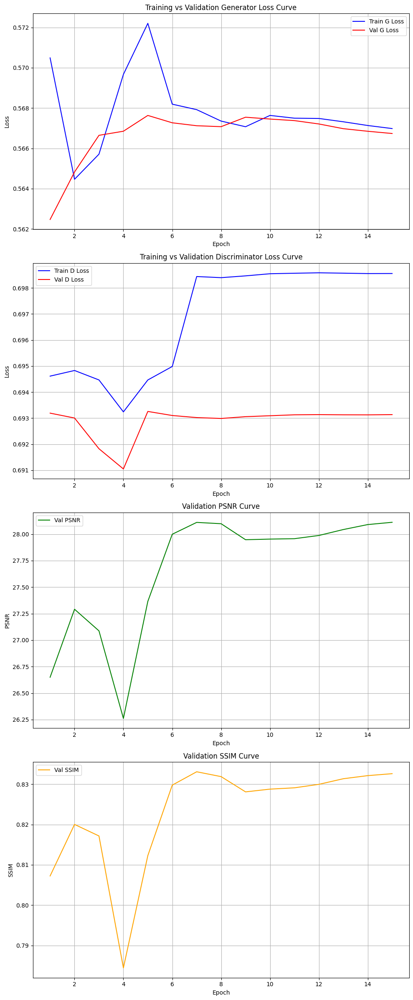

In [ ]:
train_esrgan(g_1, d_1, train_loader_esrgan, val_loader_esrgan, lr_g = 8e-5 ,lr_d=1e-5, weight_decay_g=0, weight_decay_d=1e-6, num_epochs=15)

#### Hyperparameter Tuning - ESRGAN

In [ ]:
generator_2 = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=32, num_block=4, num_grow_ch=32, scale=2)
generator_2.name = "g_2" # Rename it so we can save every different Real Esrgan pth during training
#discriminator.name = "d_1"
g_2 = generator_2
d_2 = UNetDiscriminatorSN('d_2', 3, num_feat=32, skip_connection=True) # num_feat and skip_connection are hyperparameters

Epoch 1/5: 100%|██████████| 385/385 [06:36<00:00,  1.03s/it, G_loss=0.727, D_loss=0.693]


Epoch 1/5, Train G_loss: 0.72719, Train D_loss: 0.70778, Val G_loss: 0.72670, Val D_loss: 0.69335, Val PSNR: 9.1145, Val SSIM: 0.3637,Latest Generator LR: 0.0001000,Latest Discriminator LR: 0.0000100
Best models saved!


Epoch 2/5: 100%|██████████| 385/385 [06:38<00:00,  1.03s/it, G_loss=0.727, D_loss=0.694]


Epoch 2/5, Train G_loss: 0.72440, Train D_loss: 0.69400, Val G_loss: 0.72578, Val D_loss: 0.69457, Val PSNR: 9.5462, Val SSIM: 0.3700,Latest Generator LR: 0.0001000,Latest Discriminator LR: 0.0000100
Best models saved!


Epoch 3/5: 100%|██████████| 385/385 [06:37<00:00,  1.03s/it, G_loss=0.72, D_loss=0.693]


Epoch 3/5, Train G_loss: 0.72162, Train D_loss: 0.69357, Val G_loss: 0.71931, Val D_loss: 0.69349, Val PSNR: 17.4751, Val SSIM: 0.5415,Latest Generator LR: 0.0001000,Latest Discriminator LR: 0.0000100
Best models saved!


Epoch 4/5: 100%|██████████| 385/385 [06:36<00:00,  1.03s/it, G_loss=0.717, D_loss=0.693]


Epoch 4/5, Train G_loss: 0.71790, Train D_loss: 0.69336, Val G_loss: 0.71664, Val D_loss: 0.69335, Val PSNR: 19.1048, Val SSIM: 0.5771,Latest Generator LR: 0.0001000,Latest Discriminator LR: 0.0000100
Best models saved!


Epoch 5/5: 100%|██████████| 385/385 [06:38<00:00,  1.03s/it, G_loss=0.714, D_loss=0.693]


Epoch 5/5, Train G_loss: 0.71485, Train D_loss: 0.69331, Val G_loss: 0.71412, Val D_loss: 0.69331, Val PSNR: 20.2166, Val SSIM: 0.6050,Latest Generator LR: 0.0001000,Latest Discriminator LR: 0.0000100
Best models saved!


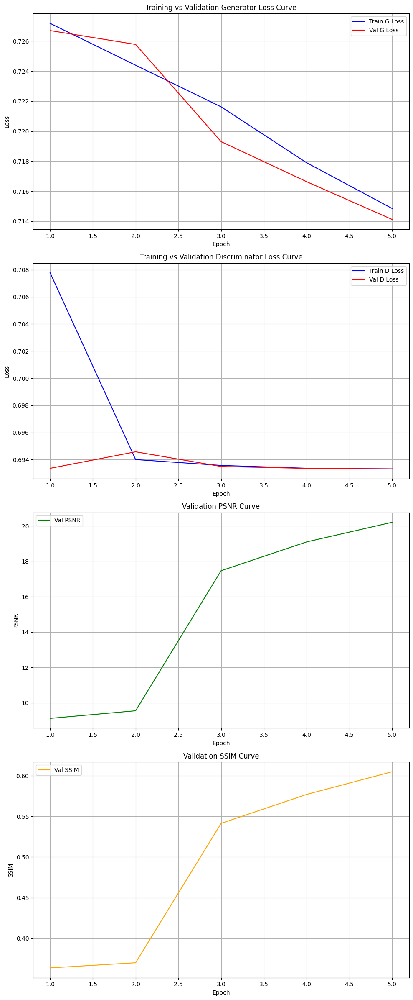

In [ ]:
train_esrgan(g_2, d_2, train_loader_esrgan, val_loader_esrgan, lr_g = 0.0001 ,lr_d=0.00001, weight_decay_g=0, weight_decay_d=0, num_epochs=5)

In [ ]:
generator_3 = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=32, num_block=4, num_grow_ch=32, scale=2)
generator_3.name = "g_3" # Rename it so we can save every different Real Esrgan pth during training
#discriminator.name = "d_1"
g_3 = generator_3
d_3 = UNetDiscriminatorSN('d_3', 3, num_feat=32, skip_connection=True) # num_feat and skip_connection are hyperparameters

Epoch 1/8: 100%|██████████| 385/385 [06:36<00:00,  1.03s/it, G_loss=0.726, D_loss=0.698]


Epoch 1/8, Train G_loss: 0.71305, Train D_loss: 0.69591, Val G_loss: 0.72485, Val D_loss: 0.69513, Val PSNR: 6.0264, Val SSIM: 0.0938,Latest Generator LR: 0.0001000,Latest Discriminator LR: 0.0000100
Best models saved!


Epoch 2/8: 100%|██████████| 385/385 [06:37<00:00,  1.03s/it, G_loss=0.699, D_loss=0.697]


Epoch 2/8, Train G_loss: 0.71783, Train D_loss: 0.69388, Val G_loss: 0.70160, Val D_loss: 0.69613, Val PSNR: 8.0075, Val SSIM: 0.3677,Latest Generator LR: 0.0001000,Latest Discriminator LR: 0.0000100
Best models saved!


Epoch 3/8: 100%|██████████| 385/385 [06:37<00:00,  1.03s/it, G_loss=0.713, D_loss=0.708]


Epoch 3/8, Train G_loss: 0.73494, Train D_loss: 0.71573, Val G_loss: 0.71260, Val D_loss: 0.70335, Val PSNR: 4.3751, Val SSIM: -0.0617,Latest Generator LR: 0.0001000,Latest Discriminator LR: 0.0000100


Epoch 4/8: 100%|██████████| 385/385 [06:38<00:00,  1.03s/it, G_loss=0.719, D_loss=0.699]


Epoch 4/8, Train G_loss: 0.72416, Train D_loss: 0.69771, Val G_loss: 0.71646, Val D_loss: 0.69993, Val PSNR: 4.5397, Val SSIM: 0.0576,Latest Generator LR: 0.0001000,Latest Discriminator LR: 0.0000100


Epoch 5/8: 100%|██████████| 385/385 [06:36<00:00,  1.03s/it, G_loss=0.711, D_loss=0.703]


Epoch 5/8, Train G_loss: 0.72383, Train D_loss: 0.69738, Val G_loss: 0.70959, Val D_loss: 0.70096, Val PSNR: 4.8766, Val SSIM: 0.0270,Latest Generator LR: 0.0000600,Latest Discriminator LR: 0.0000060


Epoch 6/8: 100%|██████████| 385/385 [06:36<00:00,  1.03s/it, G_loss=0.708, D_loss=0.703]


Epoch 6/8, Train G_loss: 0.72548, Train D_loss: 0.69445, Val G_loss: 0.70571, Val D_loss: 0.70226, Val PSNR: 3.8917, Val SSIM: -0.0692,Latest Generator LR: 0.0000600,Latest Discriminator LR: 0.0000060


Epoch 7/8: 100%|██████████| 385/385 [06:38<00:00,  1.03s/it, G_loss=0.703, D_loss=0.696]


Epoch 7/8, Train G_loss: 0.70943, Train D_loss: 0.69543, Val G_loss: 0.70406, Val D_loss: 0.69491, Val PSNR: 7.8909, Val SSIM: 0.3048,Latest Generator LR: 0.0000600,Latest Discriminator LR: 0.0000060


Epoch 8/8: 100%|██████████| 385/385 [06:38<00:00,  1.03s/it, G_loss=0.706, D_loss=0.694]


Epoch 8/8, Train G_loss: 0.70732, Train D_loss: 0.69384, Val G_loss: 0.70502, Val D_loss: 0.69496, Val PSNR: 11.8567, Val SSIM: 0.4220,Latest Generator LR: 0.0000600,Latest Discriminator LR: 0.0000060
Best models saved!


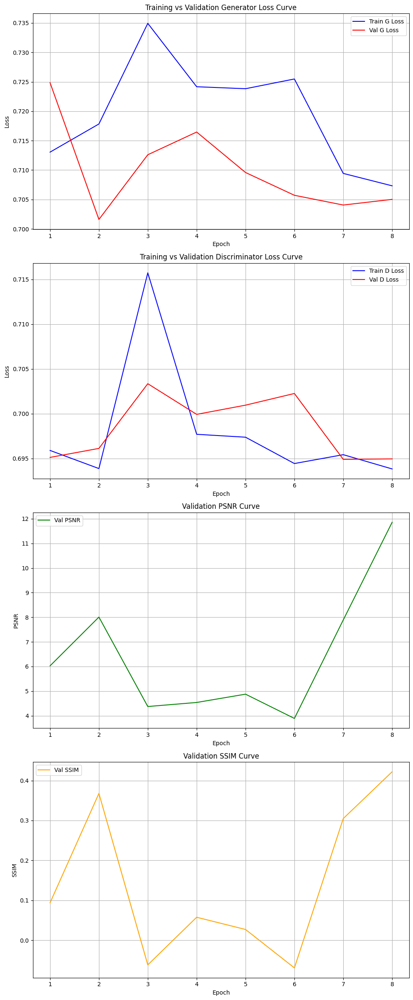

In [ ]:
train_esrgan(g_3, d_3, train_loader_esrgan, val_loader_esrgan, lr_g = 0.0001 ,lr_d=0.00001, weight_decay_g=0, weight_decay_d=0, num_epochs=8)

In [ ]:
generator_4 = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=32, num_block=4, num_grow_ch=32, scale=2)
generator_4.name = "g_4" # Rename it so we can save every different Real Esrgan pth during training
#discriminator.name = "d_1"
g_4 = generator_4
d_4 = UNetDiscriminatorSN('d_4', 3, num_feat=32, skip_connection=True) # num_feat and skip_connection are hyperparameters

Epoch 1/12: 100%|██████████| 385/385 [05:06<00:00,  1.26it/s, G_loss=0.751, D_loss=0.7]


Epoch 1/12, Train G_loss: 0.76647, Train D_loss: 0.68383, Val G_loss: 0.74156, Val D_loss: 0.68364, Val PSNR: 9.8318, Smoothed Val PSNR: 9.8318, Val SSIM: 0.3748,Latest Generator LR: 0.0000500,Latest Discriminator LR: 0.0000100
Best models saved!


Epoch 2/12: 100%|██████████| 385/385 [05:04<00:00,  1.26it/s, G_loss=0.709, D_loss=0.695]


Epoch 2/12, Train G_loss: 0.75668, Train D_loss: 0.68777, Val G_loss: 0.70863, Val D_loss: 0.68641, Val PSNR: 5.1622, Smoothed Val PSNR: 7.4970, Val SSIM: 0.0665,Latest Generator LR: 0.0000500,Latest Discriminator LR: 0.0000100


Epoch 3/12: 100%|██████████| 385/385 [05:05<00:00,  1.26it/s, G_loss=0.683, D_loss=0.699]


Epoch 3/12, Train G_loss: 0.74597, Train D_loss: 0.67695, Val G_loss: 0.68677, Val D_loss: 0.69662, Val PSNR: -1.3575, Smoothed Val PSNR: 4.5455, Val SSIM: -0.3739,Latest Generator LR: 0.0000500,Latest Discriminator LR: 0.0000100


Epoch 4/12: 100%|██████████| 385/385 [05:04<00:00,  1.27it/s, G_loss=0.766, D_loss=0.707]


Epoch 4/12, Train G_loss: 0.78386, Train D_loss: 0.68857, Val G_loss: 0.75047, Val D_loss: 0.71218, Val PSNR: 6.5547, Smoothed Val PSNR: 3.4531, Val SSIM: 0.3099,Latest Generator LR: 0.0000500,Latest Discriminator LR: 0.0000050


Epoch 5/12: 100%|██████████| 385/385 [05:03<00:00,  1.27it/s, G_loss=0.738, D_loss=0.697]


Epoch 5/12, Train G_loss: 0.73890, Train D_loss: 0.69983, Val G_loss: 0.73704, Val D_loss: 0.69642, Val PSNR: 6.0531, Smoothed Val PSNR: 3.7501, Val SSIM: 0.1131,Latest Generator LR: 0.0000350,Latest Discriminator LR: 0.0000050


Epoch 6/12: 100%|██████████| 385/385 [05:05<00:00,  1.26it/s, G_loss=0.768, D_loss=0.685]


Epoch 6/12, Train G_loss: 0.73451, Train D_loss: 0.69578, Val G_loss: 0.77540, Val D_loss: 0.68310, Val PSNR: 6.8894, Smoothed Val PSNR: 6.4991, Val SSIM: 0.3450,Latest Generator LR: 0.0000350,Latest Discriminator LR: 0.0000050


Epoch 7/12: 100%|██████████| 385/385 [04:18<00:00,  1.49it/s, G_loss=0.726, D_loss=0.696]


Epoch 7/12, Train G_loss: 0.72976, Train D_loss: 0.70115, Val G_loss: 0.72729, Val D_loss: 0.69645, Val PSNR: 12.5617, Smoothed Val PSNR: 8.5014, Val SSIM: 0.4515,Latest Generator LR: 0.0000350,Latest Discriminator LR: 0.0000025


Epoch 8/12: 100%|██████████| 385/385 [04:19<00:00,  1.48it/s, G_loss=0.726, D_loss=0.694]


Epoch 8/12, Train G_loss: 0.72638, Train D_loss: 0.70022, Val G_loss: 0.72664, Val D_loss: 0.69521, Val PSNR: 13.2879, Smoothed Val PSNR: 10.9130, Val SSIM: 0.4693,Latest Generator LR: 0.0000350,Latest Discriminator LR: 0.0000025
Best models saved!


Epoch 9/12: 100%|██████████| 385/385 [04:17<00:00,  1.49it/s, G_loss=0.725, D_loss=0.695]


Epoch 9/12, Train G_loss: 0.72587, Train D_loss: 0.69978, Val G_loss: 0.72640, Val D_loss: 0.69435, Val PSNR: 13.7863, Smoothed Val PSNR: 13.2120, Val SSIM: 0.4777,Latest Generator LR: 0.0000350,Latest Discriminator LR: 0.0000025
Best models saved!


Epoch 10/12: 100%|██████████| 385/385 [04:19<00:00,  1.48it/s, G_loss=0.725, D_loss=0.694]


Epoch 10/12, Train G_loss: 0.72572, Train D_loss: 0.69944, Val G_loss: 0.72561, Val D_loss: 0.69388, Val PSNR: 18.8199, Smoothed Val PSNR: 15.2980, Val SSIM: 0.5596,Latest Generator LR: 0.0000350,Latest Discriminator LR: 0.0000013
Best models saved!


Epoch 11/12: 100%|██████████| 385/385 [04:19<00:00,  1.48it/s, G_loss=0.726, D_loss=0.694]


Epoch 11/12, Train G_loss: 0.72528, Train D_loss: 0.69934, Val G_loss: 0.72571, Val D_loss: 0.69386, Val PSNR: 19.2446, Smoothed Val PSNR: 17.2836, Val SSIM: 0.5657,Latest Generator LR: 0.0000350,Latest Discriminator LR: 0.0000013
Best models saved!


Epoch 12/12: 100%|██████████| 385/385 [04:19<00:00,  1.48it/s, G_loss=0.725, D_loss=0.694]


Epoch 12/12, Train G_loss: 0.72506, Train D_loss: 0.69929, Val G_loss: 0.72555, Val D_loss: 0.69383, Val PSNR: 19.5858, Smoothed Val PSNR: 19.2168, Val SSIM: 0.5722,Latest Generator LR: 0.0000350,Latest Discriminator LR: 0.0000013
Best models saved!


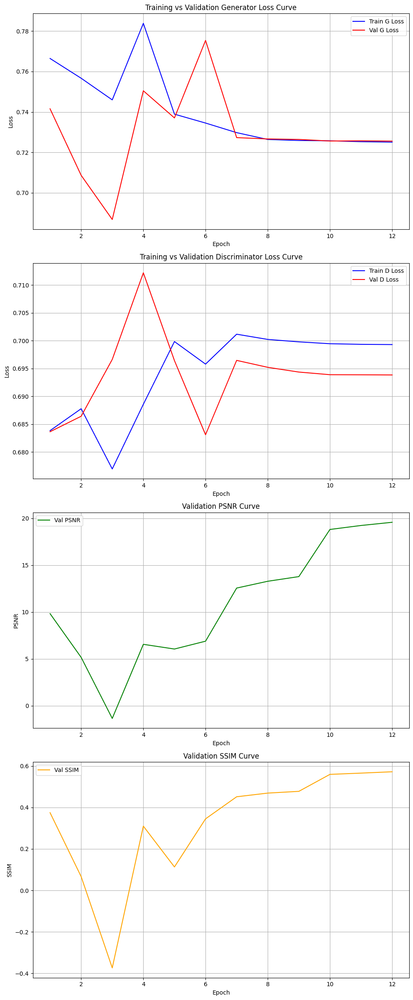

In [ ]:
train_esrgan(g_4, d_4, train_loader_esrgan, val_loader_esrgan, lr_g = 5e-5 ,lr_d=1e-5, weight_decay_g=0, weight_decay_d=0, num_epochs=12)

In [ ]:
generator_5 = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=32, num_block=4, num_grow_ch=32, scale=2)
generator_5.name = "g_5" # Rename it so we can save every different Real Esrgan pth during training
#discriminator.name = "d_1"
g_5 = generator_5
d_5 = UNetDiscriminatorSN('d_5', 3, num_feat=32, skip_connection=True) # num_feat and skip_connection are hyperparameters

Epoch 1/15: 100%|██████████| 385/385 [05:07<00:00,  1.25it/s, G_loss=0.807, D_loss=0.666]


Epoch 1/15, Train G_loss: 0.69733, Train D_loss: 0.68910, Val G_loss: 0.75252, Val D_loss: 0.68706, Val PSNR: 0.6826, Smoothed Val PSNR: 0.6826, Val SSIM: -0.0598,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000100
Best models saved!


Epoch 2/15: 100%|██████████| 385/385 [05:03<00:00,  1.27it/s, G_loss=0.663, D_loss=0.709]


Epoch 2/15, Train G_loss: 0.73512, Train D_loss: 0.69138, Val G_loss: 0.66545, Val D_loss: 0.70306, Val PSNR: 0.2395, Smoothed Val PSNR: 0.4610, Val SSIM: 0.1429,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000100


Epoch 3/15: 100%|██████████| 385/385 [05:04<00:00,  1.27it/s, G_loss=0.69, D_loss=0.691]


Epoch 3/15, Train G_loss: 0.70954, Train D_loss: 0.69415, Val G_loss: 0.69016, Val D_loss: 0.69019, Val PSNR: 4.9317, Smoothed Val PSNR: 1.9513, Val SSIM: 0.0437,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000100
Best models saved!


Epoch 4/15: 100%|██████████| 385/385 [05:05<00:00,  1.26it/s, G_loss=0.698, D_loss=0.691]


Epoch 4/15, Train G_loss: 0.69573, Train D_loss: 0.69332, Val G_loss: 0.69527, Val D_loss: 0.68874, Val PSNR: 2.2803, Smoothed Val PSNR: 2.4839, Val SSIM: -0.2771,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000035
Best models saved!


Epoch 5/15: 100%|██████████| 385/385 [05:05<00:00,  1.26it/s, G_loss=0.672, D_loss=0.699]


Epoch 5/15, Train G_loss: 0.69811, Train D_loss: 0.69515, Val G_loss: 0.67947, Val D_loss: 0.69241, Val PSNR: 3.1788, Smoothed Val PSNR: 3.4636, Val SSIM: 0.2128,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000035
Best models saved!


Epoch 6/15: 100%|██████████| 385/385 [05:04<00:00,  1.27it/s, G_loss=0.687, D_loss=0.694]


Epoch 6/15, Train G_loss: 0.68795, Train D_loss: 0.69643, Val G_loss: 0.68620, Val D_loss: 0.69409, Val PSNR: 13.8587, Smoothed Val PSNR: 6.4393, Val SSIM: 0.4742,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000035
Best models saved!


Epoch 7/15: 100%|██████████| 385/385 [04:19<00:00,  1.49it/s, G_loss=0.687, D_loss=0.694]


Epoch 7/15, Train G_loss: 0.68769, Train D_loss: 0.69931, Val G_loss: 0.68808, Val D_loss: 0.69388, Val PSNR: 15.8324, Smoothed Val PSNR: 10.9566, Val SSIM: 0.5297,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000012
Best models saved!


Epoch 8/15: 100%|██████████| 385/385 [04:17<00:00,  1.49it/s, G_loss=0.688, D_loss=0.694]


Epoch 8/15, Train G_loss: 0.68785, Train D_loss: 0.69919, Val G_loss: 0.68802, Val D_loss: 0.69383, Val PSNR: 16.2717, Smoothed Val PSNR: 15.3209, Val SSIM: 0.5382,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000012
Best models saved!


Epoch 9/15: 100%|██████████| 385/385 [04:18<00:00,  1.49it/s, G_loss=0.687, D_loss=0.694]


Epoch 9/15, Train G_loss: 0.68783, Train D_loss: 0.69916, Val G_loss: 0.68803, Val D_loss: 0.69378, Val PSNR: 16.6966, Smoothed Val PSNR: 16.2669, Val SSIM: 0.5423,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000012
Best models saved!


Epoch 10/15: 100%|██████████| 385/385 [04:19<00:00,  1.48it/s, G_loss=0.688, D_loss=0.694]


Epoch 10/15, Train G_loss: 0.68784, Train D_loss: 0.69913, Val G_loss: 0.68807, Val D_loss: 0.69372, Val PSNR: 17.1334, Smoothed Val PSNR: 16.7006, Val SSIM: 0.5468,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000004
Best models saved!


Epoch 11/15: 100%|██████████| 385/385 [04:19<00:00,  1.49it/s, G_loss=0.688, D_loss=0.694]


Epoch 11/15, Train G_loss: 0.68780, Train D_loss: 0.69910, Val G_loss: 0.68803, Val D_loss: 0.69370, Val PSNR: 17.3307, Smoothed Val PSNR: 17.0535, Val SSIM: 0.5485,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000004
Best models saved!


Epoch 12/15: 100%|██████████| 385/385 [04:17<00:00,  1.49it/s, G_loss=0.688, D_loss=0.694]


Epoch 12/15, Train G_loss: 0.68776, Train D_loss: 0.69911, Val G_loss: 0.68804, Val D_loss: 0.69369, Val PSNR: 17.4357, Smoothed Val PSNR: 17.2999, Val SSIM: 0.5474,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000004
Best models saved!


Epoch 13/15: 100%|██████████| 385/385 [04:17<00:00,  1.49it/s, G_loss=0.687, D_loss=0.694]


Epoch 13/15, Train G_loss: 0.68771, Train D_loss: 0.69910, Val G_loss: 0.68797, Val D_loss: 0.69368, Val PSNR: 17.5805, Smoothed Val PSNR: 17.4490, Val SSIM: 0.5487,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000002
Best models saved!


Epoch 14/15: 100%|██████████| 385/385 [04:19<00:00,  1.48it/s, G_loss=0.687, D_loss=0.694]


Epoch 14/15, Train G_loss: 0.68767, Train D_loss: 0.69909, Val G_loss: 0.68793, Val D_loss: 0.69369, Val PSNR: 17.6091, Smoothed Val PSNR: 17.5418, Val SSIM: 0.5491,Latest Generator LR: 0.0000800,Latest Discriminator LR: 0.0000002
Best models saved!


Epoch 15/15: 100%|██████████| 385/385 [04:19<00:00,  1.49it/s, G_loss=0.688, D_loss=0.694]


Epoch 15/15, Train G_loss: 0.68762, Train D_loss: 0.69910, Val G_loss: 0.68791, Val D_loss: 0.69368, Val PSNR: 17.7495, Smoothed Val PSNR: 17.6464, Val SSIM: 0.5481,Latest Generator LR: 0.0000560,Latest Discriminator LR: 0.0000002
Best models saved!


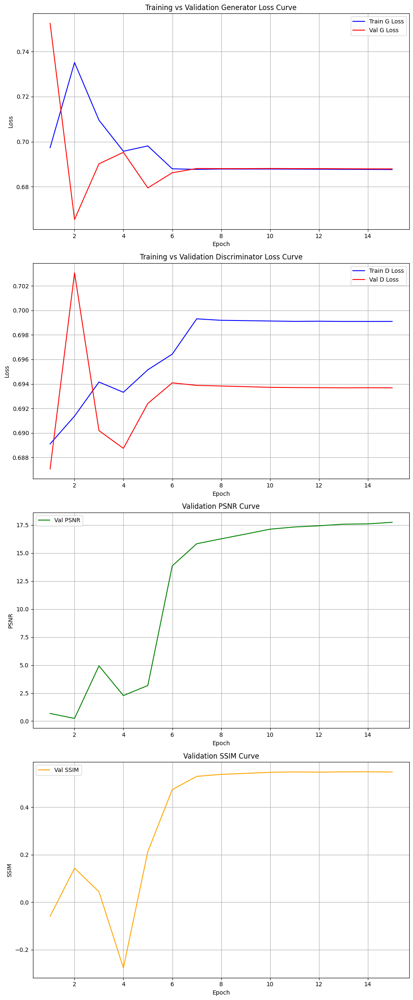

In [ ]:
train_esrgan(g_5, d_5, train_loader_esrgan, val_loader_esrgan, lr_g = 8e-5 ,lr_d=1e-5, weight_decay_g=0, weight_decay_d=1e-6, num_epochs=15)

## **Result**

During evaluation and visualization, we tested the statistics and SR images on every models' best states. By convention, it is not recommended to do so because the test data should be introduced to only 1 best model state from each of the 3 different models we developed, purely based on the validation results. However, we believe that both PSNR and SSIM cannot fully represent the real perception of human. Thus, we generated both numeric stats and visuals for each best states above, and the optimal models choice is made through inspecting PSNR, SSIM and Image altogether by all team members.

The table below summarizes the test result for best SRCNN, FSRCNN and RFDN.

In [ ]:
result_df = pd.DataFrame(columns=['Model', 'PSNR', 'SSIM'])
result_df['Model'] = ['SRCNN', 'FSRCNN', 'RFDN']
result_df['Test PSNR'] = [30.7439, 30.8411, 31.4845]
result_df['Test SSIM'] = [0.8983, 0.8987, 0.9081]
result_df['Validation PSNR'] = [29.0493, 29.2015, 29.8625]
result_df['Validation SSIM'] = [0.8776, 0.8795, 0.8924]
result_df['Hyperparameters'] = ['Learning Rate 0.001, Batch Size 32, Weight Decay 0.00001, Epochs 30', 'Learning Rate 0.001, Batch Size 32, Weight Decay 0, Skip Connections True, d 56, s 12, m 4, Epochs 40', 'Learning Rate 0.001, Batch Size 8, Weight Decay 0, Epochs 30, Optimizer Normal Adam']
result_df

,Model,PSNR,SSIM,Test PSNR,Test SSIM,Validation PSNR,Validation SSIM,Hyperparameters
0,SRCNN,NaN,NaN,30.7439,0.8983,29.0493,0.8776,"Learning Rate 0.001, Batch Size 32, Weight Dec..."
1,FSRCNN,NaN,NaN,30.8411,0.8987,29.2015,0.8795,"Learning Rate 0.001, Batch Size 32, Weight Dec..."
2,RFDN,NaN,NaN,31.4845,0.9081,29.8625,0.8924,"Learning Rate 0.001, Batch Size 8, Weight Deca..."


## **Deployment**

All model states can be found [here](https://drive.google.com/drive/folders/1ecGBhRTSBikCi7Gs0sAV_dnp1uslZKGo?usp=sharing)

### Load the best model states

In [ ]:
model = rfdn_1  # Replace this with actual model class
model.to(device)

# Load the best model
model.load_state_dict(torch.load(f"best_model_{model.name}.pth"))

<All keys matched successfully>

In [ ]:
# Calculate the test loss, psnr and ssim
evaluate(model, test_loader_rf, criterion_L1)

(0.031207411209801715,
 tensor(31.4845, device='cuda:0'),
 tensor(0.9081, device='cuda:0'))

### Generate Super Resolution Images on New Data from Model

In [ ]:
# Save Generated Images from Best Models

generated_images = []
generated_dir = r'best predicted test images'  # Dir to store the generated/predicted images on test
os.makedirs(generated_dir, exist_ok=True)

frame_counter = 0  # counter used as the ID for each frame
model.eval()
with torch.no_grad():
    for lr, hr in test_loader_rf:
        lr, hr = lr.to(device), hr.to(device)

        # Predicted image (256x256)
        output_image = model(lr)

        # Convert from [-1,1] to [0,1]
        output = (output_image + 1) / 2

        # Convert from [0,1] to [0, 255]
        output = output * 255

        # Convert to uint8
        output = output.clamp(0, 255).byte()

        # Iterate over each image in each batch
        for j in range(output.size(0)):
            # Extract a single image (C, H, W) from the batch
            single_image = output[j].permute(1, 2, 0).cpu().numpy()  # [C, H, W] -> [H, W, C]
            generated_images.append(single_image)

            # Save each image to disk with a 5-digit filename, zero-padded
            image_filename = os.path.join(generated_dir, f"frame_{frame_counter:05d}.png")
            Image.fromarray(single_image).save(image_filename)

            # Increment the counter after saving each image
            frame_counter += 1

### Combined the SR images and pre-extracted sound and convert to SR Video

In [ ]:
# Create directory for output video on test from our best models
output_video_path_noaudio = r"output_video_no_audio.mp4"
output_video_path_withaudio = r"output_video_with_audio.mp4"
#os.makedirs(output_video_path, exist_ok=True)

In [ ]:
def combine_frames_to_video(frames_dir, video_path_noaudio, video_path_with_audio, audio_path, frame_rate=frame_rate_hr):
    model_name = input("Which model? SRCNN, FSRCNN or RFDN?").lower()
    sr_path_no_audio = f'{model_name}_' + video_path_noaudio
    sr_path_audio = f'{model_name}_' + video_path_with_audio
    ffmpeg.input(f"{frames_dir}/frame_%05d.png", framerate=frame_rate).output(video_path_noaudio, pix_fmt="yuv420p").run(overwrite_output=True)

    # Combine video and audio
    video_stream = ffmpeg.input(sr_path_no_audio)
    audio_stream = ffmpeg.input(audio_path)

    # Final output with video and audio

    ffmpeg.output(audio_stream, video_stream, sr_path_audio).run(overwrite_output=True)
                                              # Final SR Video Path
    print(f'The Generated Super Resolution Images Have Been Saved to {frames_dir}')
    print(f'The Generated Super Resolution Video Has Been Saved to {sr_path_audio}')

In [ ]:
combine_frames_to_video(generated_dir, output_video_path_noaudio, output_video_path_withaudio, audio_path_hr_test)

Which model? SRCNN, FSRCNN or RFDN?RFDN


All generated images can be downloaded as a zip file

In [ ]:
!zip -r my_files.zip /content/best_predicted_test_images


## **Demo (Implementation on new data)**

Note: If the embedded video playing function may be lost after converting the notebook to HTML, so you can go to the notebook on Colab through the link we shared in the beginning to play the videos in this part. If it is still not showing properly below, you can follow the instructions and code below to execute or view the videos directly via the 'Download Link' below.

In [ ]:
from google.colab import files
files.upload()  # Select files manually

MessageError: TypeError: Cannot read properties of undefined (reading '_uploadFiles')

In [ ]:
from IPython.display import HTML, display
from base64 import b64encode

### Demo Images New

Click [here](https://drive.google.com/drive/folders/1XEWkP6O5afejs5tYTKdLxow7MaRdAcag?usp=sharing) to view our output frames

### Demo Videos New

Upload the Low Resolution, Super Resolution and High Resolution Videos. [Download Link](https://drive.google.com/drive/folders/14Yc_-PPudI8zhPyjDnJCk9sNYgxng1Ob?usp=drive_link)

Encode the videos so that it is supported by HTML Display

In [ ]:
!ffmpeg -i /content/LR_360p.mp4 -vcodec libx264 -acodec aac lr_output.mp4 # Original 360p
!ffmpeg -i /content/SR_1080p.mp4 -vcodec libx264 -acodec aac sr_output.mp4 # SR 1080p
!ffmpeg -i /content/HR_1080p.mp4 -vcodec libx264 -acodec aac hr_output.mp4 # Original 1080p

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
lr_mp4 = open('lr_output.mp4','rb').read()
lr_data_url = "data:video/mp4;base64," + b64encode(lr_mp4).decode()
sr_mp4 = open('sr_output.mp4','rb').read()
sr_data_url = "data:video/mp4;base64," + b64encode(sr_mp4).decode()
hr_mp4 = open('hr_output.mp4','rb').read()
hr_data_url = "data:video/mp4;base64," + b64encode(hr_mp4).decode()

#### LR 360 vs. SR 1080

In [ ]:
# Display comparison with improved text visibility
HTML(f"""
<div style="
    display: flex;
    gap: 20px;
    align-items: flex-start;
    background: #f0f0f0;
    padding: 15px;
    border-radius: 10px;
    font-family: Arial, sans-serif;
">
    <div style="text-align: center;">
        <h4 style="margin: 5px 0 10px 0; color: #333; font-size: 18px; font-weight: bold;">360p (Low Resolution)</h4>
        <video controls width="640" style="box-shadow: 0 2px 8px rgba(0,0,0,0.1);">
            <source src="{lr_data_url}" type="video/mp4">
        </video>
    </div>
    <div style="text-align: center;">
        <h4 style="margin: 5px 0 10px 0; color: #333; font-size: 18px; font-weight: bold;">1080p (Super Resolution)</h4>
        <video controls width="640" style="box-shadow: 0 2px 8px rgba(0,0,0,0.1);">
            <source src="{sr_data_url}" type="video/mp4">
        </video>
    </div>
</div>
""")

#### SR 1080 vs. HR 1080

In [ ]:
# Display comparison with improved text visibility
HTML(f"""
<div style="
    display: flex;
    gap: 20px;
    align-items: flex-start;
    background: #f0f0f0;
    padding: 15px;
    border-radius: 10px;
    font-family: Arial, sans-serif;
">
    <div style="text-align: center;">
        <h4 style="margin: 5px 0 10px 0; color: #333; font-size: 18px; font-weight: bold;">1080p (Super Resolution)</h4>
        <video controls width="640" style="box-shadow: 0 2px 8px rgba(0,0,0,0.1);">
            <source src="{sr_data_url}" type="video/mp4">
        </video>
    </div>
    <div style="text-align: center;">
        <h4 style="margin: 5px 0 10px 0; color: #333; font-size: 18px; font-weight: bold;">1080p (High Resolution)</h4>
        <video controls width="640" style="box-shadow: 0 2px 8px rgba(0,0,0,0.1);">
            <source src="{hr_data_url}" type="video/mp4">
        </video>
    </div>
</div>
""")

## **Discussion**

### Achievements

In this research, we thoroughly studied video resolution enhancement models (i.e., SRCNN, FSRCNN, RFDN and Real-ESRGAN) and successfully upscaled the 360P animation video to 1080P.

After hyperparameter tuning, SRCNN, FSRCNN and RFDN showed better and more robust super-resolution performance than Real-ESRGAN. The PSNR value of our best model RFDN on the test dataset has reached 31.4845 and the SSIM value has reached 0.9081, indicating the model's transformative ability of animation super resolution.

The restored super resolution videos and frames are significantly better than the low resolution counterparts, showing the strong enhancement delivered by our model.


### Challenges

During doing research for the four models mentioned in previous section, we encountered some challenges:
1. Limitations on computational power. Since the target images have large size (1920*1080), all our models required large GPU RAM during training. To adress this, we bought 500 computing unit on Google Colab and use A100 GPU to train our models.
2. Challenges of Real-ESRGAN: We expected Real-ESRGAN can perform well on video resolution before doing the experiment. However, since REAL-ESRGAN has a much complicated architecture and two models (generator and discriminator) to train in parallel, the GPU RAM it required is much larger than the other models. With Google Colab A100 graphic card, we still can not train REAL-ESRGAN with a decent batch size (i.e. 16, 32). We tried to use smaller batch size like 8 or 4, but training phase became unstable and we barely gained improvements. Meanwhile, tuning hyperparameters of GAN model is always more tough than regular CV models. We spent almost one week on tuning hyperparameters of REAL-ESRGAN but with small batch size, we didn't get any decent results. After all these, we decided to give up on REAL-ESRGAN.  

### Findings

There are 2 parts we found hugely affect the visual perception of the SR videos.

1. For ink-style paintings with strong traditional elements, the model prioritizes overall image quality enhancement, but might overlook fine details. Ink paintings typically feature large color blocks and brushstrokes, with fewer intricate edges and textures.
2. The model might produce rough textures in fine details, especially in edge areas. This typically happens when reconstructing fine textures, where the model fails to capture intricate structural information.

### Future Improvements

There are many improvements that we can make in our future work:
1. We can try with different learning rate schedulers like  Step Decay Scheduler and Cosine Annealing Scheduler.
2. We can try to use L1 loss as the loss function for starting phase, and change it to L2 loss after model being trained for some epochs.
3. We may use VGG16 to do Perceptrual Loss to combine SSIM and PSNR to form a more decent evaluation metric.
4. We may try to mix out training dataset with other animation styles to enhance the generalization ability of our model.

## References

[1] Dong, C., Loy, C. C., He, K., & Tang, X. (2015). Image Super-Resolution Using Deep Convolutional Networks. https://arxiv.org/abs/1501.00092

[2] Dong, C., Loy, C. C., & Tang, X. (2016). Accelerating the Super-Resolution Convolutional Neural Network. https://arxiv.org/abs/1608.00367

[3] Liu, J., Tang, J., & Wu, G. (2020). Residual Feature Distillation Network for Lightweight Image Super-Resolution. https://arxiv.org/abs/2009.11551

[4] Wang, X., Xie, L., Dong, C., & Shan, Y. (2021). Real-ESRGAN: Training Real-World Blind Super-Resolution With Pure Synthetic Data. Proceedings of the IEEE/CVF International Conference on Computer Vision (ICCV) Workshops, 1905–1914.